# Preparing for EDA

In [1]:
# Importing required libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from time import time

import plotly.graph_objects as go
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings('ignore')

In [2]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/88.0.4324.190 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,hi;q=0.6" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/9120/860599/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1614688655&Signature=WlyW%2FDBbdjmx0d5O01eP1yAMWdc7hT26KVLEamUZQjQ966ulEmehjQq3CUCIMPZFXr9Ice3a%2FqOWOZEwhgE6xWpVsaxgw12Tz9KfZB0MPZt%2FB0%2Fo9EWmOzCEPrhkVYNnpVllj0hGxjnERe8kyjSMFmfGNIPpiTUdh1usADxl5Y1tQ%2Fs5qVm8JOzh9EJkq8hQpESjPFkCzxajwbD6ADxTHexMxwVuJ2MeFrjbPRQQmM%2FluiB2mSO3%2BSLMDWKsTW8c2Zo9kMxtO3fX1KMK6MljrmK37YCK6csXTEE6jJf2HtCHErf3jHecOQYo2iLCQtYYeGmLsnWlFu035pzVoJA3%2BQ%3D%3D&response-content-disposition=attachment%3B+filename%3Dhome-credit-default-risk.zip" -c -O 'home-credit-default-risk.zip'

--2021-03-02 11:54:52--  https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/9120/860599/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1614688655&Signature=WlyW%2FDBbdjmx0d5O01eP1yAMWdc7hT26KVLEamUZQjQ966ulEmehjQq3CUCIMPZFXr9Ice3a%2FqOWOZEwhgE6xWpVsaxgw12Tz9KfZB0MPZt%2FB0%2Fo9EWmOzCEPrhkVYNnpVllj0hGxjnERe8kyjSMFmfGNIPpiTUdh1usADxl5Y1tQ%2Fs5qVm8JOzh9EJkq8hQpESjPFkCzxajwbD6ADxTHexMxwVuJ2MeFrjbPRQQmM%2FluiB2mSO3%2BSLMDWKsTW8c2Zo9kMxtO3fX1KMK6MljrmK37YCK6csXTEE6jJf2HtCHErf3jHecOQYo2iLCQtYYeGmLsnWlFu035pzVoJA3%2BQ%3D%3D&response-content-disposition=attachment%3B+filename%3Dhome-credit-default-risk.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.137.128, 142.250.101.128, 2607:f8b0:4023:c03::80, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.137.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 721616255 (688M) [application/zip]
Saving to: ‘home-credit-default

In [3]:
# Un-Zip the data
!unzip 'home-credit-default-risk.zip' -d '/data'

Archive:  home-credit-default-risk.zip
  inflating: /data/HomeCredit_columns_description.csv  
  inflating: /data/POS_CASH_balance.csv  
  inflating: /data/application_test.csv  
  inflating: /data/application_train.csv  
  inflating: /data/bureau.csv        
  inflating: /data/bureau_balance.csv  
  inflating: /data/credit_card_balance.csv  
  inflating: /data/installments_payments.csv  
  inflating: /data/previous_application.csv  
  inflating: /data/sample_submission.csv  


# Helper Functions

In [2]:
# Function to load the data
def load_csv_data(directory = '', file_list = []):
  '''
  Function Description : Load the data into our memory. 

  Input Parameters:
     directory : Give the path of the directory in which your data is stored. 
       (default value: '')
     file_list : This is a list of all the csv files we need to load. 
       (default value : [] - Empty List) 
  
  Output:
    List of all the dataframes in which the data is stored.
  '''
  num_of_files = len(file_list) 
  print('Loading your {} csv file(s), please wait...'.format(num_of_files))
  start_time = time()
  final_df_names = []
  for name in file_list:
    name = pd.read_csv(directory + name)
    final_df_names.append(name)
  print('All the csv files loaded into memory!')
  print('Time taken to load these data file(s) : {} seconds'.format(round(time() - start_time, 2)))
  return final_df_names


In [3]:
# Function to view what some info about the data
def data_glimpse(df, df_name, col_dtypes = False):
  '''
  Description: Giving you the basic info about each dataframe passed. 
  That includes the shape of df, column names, number of numerical and categorical features (if the flag is True),
  Finally, the first 5 rows of the data.

  Input Parameters:
     df : The dataframe you want to know more about. 
     df_name : The name of the dataframe.
     col_dtypes : Set true if you want to print out the type of features the dataframe has. (default: False)
  Output:
    None.
  '''
  print("The Shape of "+df_name+" is : {}".format(df.shape))
  print("-"*100)
  # Second : Print out the columns it has
  print("Columns in "+df_name+" :")
  print('\n')
  print(df.columns)
  print("-"*100)
  # How many numerical and categorical columns?
  if col_dtypes:
    print("Types of columns present in the dataframe: ")
    print('')
    display(df.dtypes.value_counts())
    print("-"*100)
  # Finally print the head showing the first 5 rows of the dataframe
  display(df.head(5))

In [4]:
# Function to know more about the missing (NaN values) in our Data by Columns
# Reference : https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction

def missing_values_table_plot(df, plot_bar = False, figsize = (20,15)):
        '''
        Description: Take input as a dataframe, and give out a dataframe listing all the
        percentage of missing values by column.

        Input Parameters:
           df : The dataframe you need to find missing values of.
           plot_bar : Flag to indicate whether to plot a bar graph of the data or not. 
        Output:
          type : Dataframe
          data : It will have 2 columns, one with the column name of original data and the 2nd stating 
                 the % of missing values for that particular column.
        '''
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        if mis_val_table_ren_columns.shape[0] == 0:
          print("There are no missing values in the dataframe.")
        
        else:
          if plot_bar:
            # If the user wants to show a bar plot
            plt.figure(figsize=figsize)
            sns.barplot(data = mis_val_table_ren_columns, y = mis_val_table_ren_columns.index, x = '% of Total Values', orient = 'h')
            plt.grid()
            plt.show()
            # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [5]:
#Function to plot graphs for Categorical Data Count
def plot_categorical_feature_count(df, feature_name = '', plot_pie = False, plot_bar = True, figsize = (12,10)):
  '''
  Description : This function plots 2 types of graph for categorical data based on provided Flag values.
  The graphs are pie plot and bar plot. By default, it prints bar plots.

  Input Parameters:
    df : dataframe
    feature_name : Name of the Categorical Feature (default = "")
    plot_pie : Flag to see if pie plot needs to be shown (default : False)
    plot_bar : Flag to see if bar plot is shown (default : True)
    figsize : Size of the overall plot.
  
  Output:
    None
  '''
  # Case 1 : both flags are true.
  if plot_pie and plot_bar:
    
    df[feature_name].value_counts().plot(kind = 'bar')
    plt.title('Bar plot of {}'.format(feature_name))
    plt.xlabel('Categories')
    plt.ylabel('Count')

    x = df[feature_name].value_counts()
    fig = go.Figure(data=[go.Pie(labels=x.index,
                             values=x.values, title = 'Pie Plot of {}'.format(feature_name))])
    fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(line=dict(color='#000000', width=2)))
    fig.show()

  # Case 2: Only show Pie Plot
  elif plot_pie:
    plt.figure(figsize = figsize)
    x = df[feature_name].value_counts()
    fig = go.Figure(data=[go.Pie(labels=x.index,
                             values=x.values, title = 'Pie Plot of {}'.format(feature_name))])
    fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(line=dict(color='#000000', width=2)))
    fig.show()
  
  # Case 3: Only show bar plot
  else:
    plt.figure(figsize = figsize)
    df[feature_name].value_counts().plot(kind = 'bar')
    plt.title('Bar plot of {}'.format(feature_name))
    plt.xlabel('Categories')
    plt.ylabel('Count')
    plt.legend()
    plt.show()

In [6]:
# Function to plot categorical data with respect to target variable.
def plot_categorical_wrt_target(df, feature_name = '', plot_pie = False, plot_count = False, figsize = (15,10)):
  '''
  Description : This function plots 2 types of graph for categorical data based on target column.
  The graphs are pie plot and count plot. By default, it shows a count plot.

  Input Parameters:
    df : dataframe
    feature_name : Name of the Categorical Feature (default = "")
    plot_pie : Flag to see if pie plot needs to be shown (default : False)
    plot_count : Flag to see if bar plot is shown (default : True)
    figsize : Size of the overall plot.
  
  Output:
    None
  '''
  # Case 1: Only show Pie Plot
  if plot_pie and plot_count:
    print("Cannot Plot both Plots together.")
  
  elif plot_pie:
    x = df.groupby('TARGET')[feature_name].value_counts().unstack(0)
    x_target_0 = x[0]
    x_target_1 = x[1]
    # Creating subplots to show 2 pie charts
    fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])
  
    fig.add_trace(go.Pie(labels=x_target_0.index, values=x_target_0.values, title = 'Non-Defaulters'), 1, 1)
    fig.add_trace(go.Pie(labels=x_target_1.index, values=x_target_1.values, title = 'Defaulters'), 1, 2)

    fig.update_traces(hoverinfo='label+percent', textinfo='value', textfont_size=20,
                  marker=dict(line=dict(color='#000000', width=2)))
    fig.update(layout_title_text="Pie Plots for {}".format(feature_name),
           layout_showlegend=True)
    fig.show()
  
  # Case 2: Only show bar plot
  elif plot_count:
    plt.style.use('fivethirtyeight')
    plt.figure(figsize = figsize)
    df.groupby('TARGET')[feature_name].value_counts().unstack(0).plot.barh()
    plt.title('Count plot of {}'.format(feature_name) + ' for Target Feature')
    plt.xlabel('Categories')
    plt.ylabel('Count wrt Target')
    plt.legend()
    plt.show()

  else:
    print('Please check the flag values.')


In [7]:
# Function to compute correlation between given continuous valued features of a dataframe.
def compute_correlation(cont_features_df, draw_matrix = False, annot = True, linewidths = 0.3, method = 'pearson', figsize = (12,10)):
  '''
  Description : To compute the correlation values between the features of a given Dataframe.
                Optionally, you can also select which correlation do you want to compute.
                Also, you can choose if you want to plot the Correlation Matrix.
  
  Input Parameters:
    cont_features_df : Dataframe with the selected features. (Only supports continuous features, type : DataFrame)
    draw_matrix : Whether to return the Matrix Figure. (default : False, type : Bool)
    annot : Annotation attribute for the matrix. (default : False, type : Bool)
    linewidths : Width between each component of matrix. (default : 0.3)
    method : What type of correlation metric do you want to compute. (default : 'pearson', values : {‘pearson’, ‘kendall’, ‘spearman’})
    figsize : size of the correlation Matrix.

  Output Paramters:
    corr_df : Dataframe with all the correlation values.
  '''
  # Compute the correlation values using the pandas corr() function
  corr_values = cont_features_df.corr(method = method)
  if draw_matrix:
    plt.figure(figsize = figsize)
    sns.heatmap(corr_values, annot = annot, linewidths = linewidths)
    
  return corr_values

In [8]:
# Function to plot continuous variables.
def plot_cont_feature(df, feature_name, with_target = False, which_plots = ['dist', 'box', 'violin', 'cdf', 'binned_data'] , describe_data = False, figsize = (20,15)):
  '''
  Description: This function helps us show various plots on the continuous feature of our choice.
               Possible plots are Distplots, box plots, violin plots and a special binned plot.

  Input Parameters:
    df : The main dataframe.
    feature_name : Name of the continuous feature. (default : False, type : Bool) 
    which_plots : List of all the plots you would like to plot. (default : ['dist', 'box', 'violin', 'binned_data'], type : List)
    describe_data : Whether to print describe data info. (default : False, type : Bool)
    figsize : Size of the overall plot. 
    save_image : Save the plot Image. (default : False, type : Bool)
  
  Output:
    None
  '''
  # Getting the number of plots to decide subplots
  num_plots = len(which_plots)
  # Check Describe flag.
  if describe_data:
    print(df[feature_name].describe())
    print('-'*150)
  
  # Check if with_target is true
  if with_target:
    # If its true, we need to plot bi variate plots with hue as Target feature.
    plt.figure(figsize = figsize)
    for i,plot in enumerate(which_plots):
      # Subplots
      plt.subplot(1, num_plots, i+1)
      plt.subplots_adjust(right= 2)
      plt.style.use('fivethirtyeight')
      # Check conditions for plots:
      if plot == 'dist':
        # Distribution or KDE Plot
        sns.kdeplot(df.loc[df['TARGET'] == 0, feature_name], label = "Non-Defaulter")
        sns.kdeplot(df.loc[df['TARGET'] == 1, feature_name], label = "Defaulter")
        plt.title('{} Distribution with respect to Target'.format(feature_name))
        plt.xlabel(feature_name)
        plt.ylabel('Density')

      elif plot == 'box':
        sns.boxplot(x='TARGET', y=feature_name, data=df)
        plt.title("Box-Plot of {}".format(feature_name) + ' wrt target.')

      elif plot == 'violin':
        sns.violinplot(x='TARGET', y=feature_name, data=df)
        plt.title("Violin-Plot of {}".format(feature_name) + ' wrt target.')

      elif plot == 'cdf':
        sns.kdeplot(df.loc[df['TARGET'] == 0, feature_name], label = "Non-Defaulter", cumulative = True)
        sns.kdeplot(df.loc[df['TARGET'] == 1, feature_name], label = "Defaulter", cumulative = True)
        plt.title('{} Clumulative Distribution with respect to Target'.format(feature_name))
        plt.xlabel(feature_name)

      else:
        print('Invalid Plot type')
    
  else:
    # If its true, we need to plot bi variate plots with hue as Target feature.
    plt.figure(figsize = figsize)
    for i,plot in enumerate(which_plots):
      # Subplots
      plt.subplot(1, num_plots, i+1)
      plt.subplots_adjust(right= 2)
      plt.style.use('fivethirtyeight')
      # Check conditions for plots:
      if plot == 'dist':
        # Distribution or KDE Plot
        sns.kdeplot(data = df, label = feature_name, x = feature_name)
        plt.title('{} PDF'.format(feature_name))
        plt.xlabel(feature_name)
        plt.ylabel('Probablity')

      elif plot == 'box':
        sns.boxplot(y=feature_name, data=df)
        plt.title("Box-Plot of {}".format(feature_name))

      elif plot == 'violin':
        sns.violinplot(y=feature_name, data=df)
        plt.title("Violin-Plot of {}".format(feature_name))

      elif plot == 'cdf':
        sns.kdeplot(data = df, label = feature_name, x = feature_name, cumulative = True)
        plt.title('{} Clumulative Distribution with respect to Target'.format(feature_name))
        plt.xlabel(feature_name)
    
    plt.show()


# <u>Actual EDA starts here</u>

## About the Data Provider

<img src = 'https://upload.wikimedia.org/wikipedia/commons/thumb/c/cb/Home-Credit-logo.jpg/220px-Home-Credit-logo.jpg' />

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.






## Details about the provided Data Files





Reference : https://www.kaggle.com/c/home-credit-default-risk/data

1. **application_{train|test}.csv**

This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET). Static data for all applications. One row represents one loan in our data sample.

2. **bureau.csv**

All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample). For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

3. **bureau_balance.csv**

Monthly balances of previous credits in Credit Bureau. This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.

4. **POS_CASH_balance.csv**

Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit. This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.

5. **credit_card_balance.csv**

Monthly balance snapshots of previous credit cards that the applicant has with Home Credit. This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.

6. **previous_application.csv**

All previous applications for Home Credit loans of clients who have loans in our sample. There is one row for each previous application related to loans in our data sample.

7. **installments_payments.csv**

Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample. There is a) one row for every payment that was made plus b) one row each for missed payment. One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.

### How is the data related. (How to join or merge)


<img src = 'https://storage.googleapis.com/kaggle-media/competitions/home-credit/home_credit.png' />

### EDA process description

Now, we will follow the following steps for each data file for EDA:

1. We will first print out some information about the data file like number of columns, shape of the dataframe, etc.

2. Next, we will know more about the missing values of the dataset and also show a bar plot distribution. 

3. Next, we will analyse the categorical features. We will do that by printing some info about the data and along with that we will plot the data based on counts and also based on its counts with respect to the **target** feature. (If the file doesnt have target feature, we will merge it with the dataframe). We will use Bar and Pie plots for this analysis. 

4. Next, we will analyse the continuous features. For this, we will plot a number of graphs like pdf, cdf, box plot and violin plots. We also have an option to print some metrics for the data.

Please note that this is an Exhaustive EDA of every data file we have, so we will have observations after every plot and data we display. Now, let us start with the first data file. 


## Application Train/Test 

Data Overview: From the info provided by Home Credit and analysis, this will by a very important source of information as it has every detail filled by the customer for his loan operation. Moreover, this is the data file with the **Target** variable. 

The data is divided into train and test data. The only difference between 2 files is the absence of Target column in the test data, and the size of the data files.

#### <b>1. Load the data</b>

In [9]:
# Using the Load Data Function
temp = load_csv_data(directory = '../data/', file_list = ['application_train.csv', 'application_test.csv'])
# storing the dataframe into a variable
app_train = temp[0]
app_test = temp[1]

Loading your 2 csv file(s), please wait...
All the csv files loaded into memory!
Time taken to load these data file(s) : 7.25 seconds


#### <b>2. Let us see some basic information about the application_train data file</b>

In [10]:
# Print out the Data Glimpse for the applcation train data
data_glimpse(app_train, 'application_train', col_dtypes=True)

The Shape of application_train is : (307511, 122)
----------------------------------------------------------------------------------------------------
Columns in application_train :


Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=122)
----------------------------------------------------------------------------------------------------
Types of columns present in the dataframe: 



float64    65
int64      41
object     16
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
# Print out the number of unique ID's in the dataframe
num_unique_id = app_train['SK_ID_CURR'].nunique()
print("There are {} unique values of SK_ID_CURR in application_train.".format(num_unique_id))

There are 307511 unique values of SK_ID_CURR in application_train.


In [12]:
# Print out the Data Glimpse for the applcation test data
data_glimpse(app_test, 'application_test', col_dtypes=True)

The Shape of application_test is : (48744, 121)
----------------------------------------------------------------------------------------------------
Columns in application_test :


Index(['SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       ...
       'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
       'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR',
       'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
       'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object', length=121)
----------------------------------------------------------------------------------------------------
Types of columns present in the dataframe: 



float64    65
int64      40
object     16
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# Print out the number of unique ID's in the dataframe
num_unique_id = app_test['SK_ID_CURR'].nunique()
print("There are {} unique values of SK_ID_CURR in application_train.".format(num_unique_id))

There are 48744 unique values of SK_ID_CURR in application_train.


**Observations:**

1. The applciation train data contains 3,07,511 unique applications of various people. There are 122 different columns. Out of that, one column is Target and another is ID. Rest of these is the information about the applicant. Also, the test data has 48,744 rows and 121 columns (excluded Target).

2. There are 16 categorical features and the rest of them are numerical/continuous features in both the dataframes.

3. This is the most important dataframe as it have the **target** feature, which is present in the application_train data but not in the test data. (It is the unseen data). 

4. There are no duplicate ID entries in either of the data sets. 

Next, we know that there are a lot of features, but what about missing values. Let us see how many columns have missing values and also plot a bar chart for better visualization. 


#### <b>3. Missing Values in the Dataset</b>

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


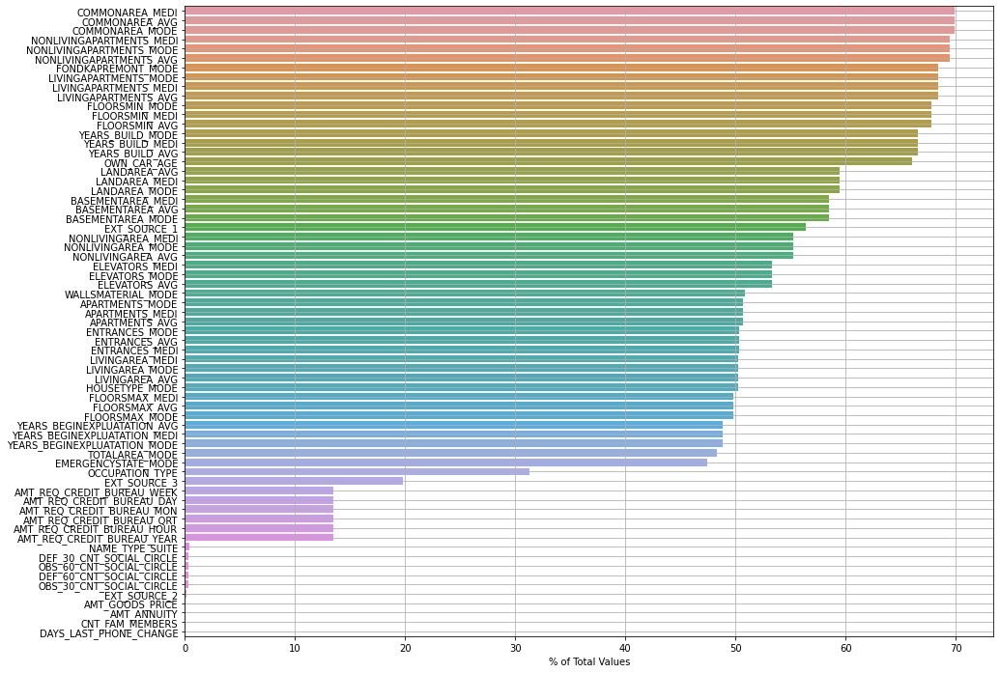

In [14]:
# Missing values in the dataframe and also show a bar plot. 
app_train_missing = missing_values_table_plot(app_train, plot_bar = True, figsize = (15,12))

Your selected dataframe has 121 columns.
There are 64 columns that have missing values.


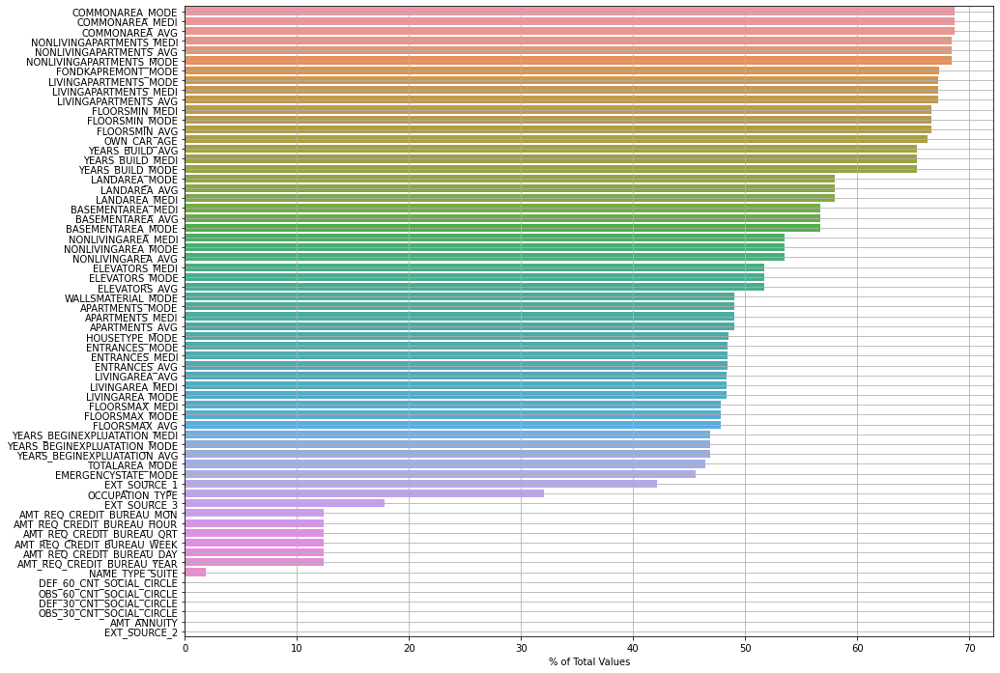

In [15]:
# Missing values in the test dataframe and also show a bar plot. 
app_test_missing = missing_values_table_plot(app_test, plot_bar = True, figsize = (15,12))

**Observations:**

1. More than 50% of the data columns have missing values, 67 columns to be exact. Hence, we cannot remove all the columns as that would a lot of data loss. We need some other technique to handle the missing values. No feature have more than 70% missing values. 

2. We can select a % threshold. For example, all the features with more than 65% missing values. We can only remove those features whose % values cross this threshold. 

3. We also observe that the features with highest number of missing values are related to the housing (apartment) of the applicant. When we consider our task of classification, this data would not be a direct feature. 

4. The missing value distribution of both the datasets is very similar.

5. One interesting observation is that the EXT_SOURCE features are one of the more important primary features in the dataset and these have a lot less values missing in the test data compared to that of train data, which is a good thing. 

**Conclusions:**

We will use mean or median imputation techniques in the data pre processing part to handle these values for both train and test dataframes.


#### <b>4. Count based on Target Column</b>

In [16]:
# Printing counts based on Target column
print("How many datapoints we have for each Target value :")
a = app_train['TARGET'].value_counts().to_dict()
print('')
print("{} % of values are of target 0 ({})".format(round((a[0]*100/(a[0]+a[1])),2), a[0]))
print("{} % of values are of target 1 ({})".format(round((a[1]*100/(a[0]+a[1])), 2), a[1]))

How many datapoints we have for each Target value :

91.93 % of values are of target 0 (282686)
8.07 % of values are of target 1 (24825)


In [17]:
# Pie Plot for the target column counts
plot_categorical_feature_count(app_train, feature_name = 'TARGET', plot_pie = True, plot_bar = False)

<Figure size 864x720 with 0 Axes>

**Observations:**

1. As you can see, the data is highly imbalanced and we need to deal with this if we need a decent performing model on this data. 

2. Out of the 300,000 records, almost 92% of the points are of Non-Deafulters and only 8% records are of Defaulters.

**Conclusions:**

I will be doing this by implementing up-sampling of my data. (esentially it is repeating the 8% of the data over and over).

We will do an analysis of only the train data features as we are going to train our model on the train distribution and we do not want to use any info of the test data. (We want it to be totally unseen).

#### <b>5. EDA of Categorical Features</b>

We will do visual analysis of some of the important categorical features of application_train. We have chosen select features based on some blogs, previous analysis. Let is us first look at the categorical features we have.

In [18]:
# Print the names of all the categorical features the dataframe has and print the number of unique values each has
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

##### <b>NAME_CONTRACT_TYPE</b>

There are 2 types of loans in this data:

*   Cash Loans
*   Revolving Loans

Let is see the counts for the selected feature. We will have 2 plots:

1. Count based Bar Plot
2. Counts with respect to the Target Feature (Pie Plot)




Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64


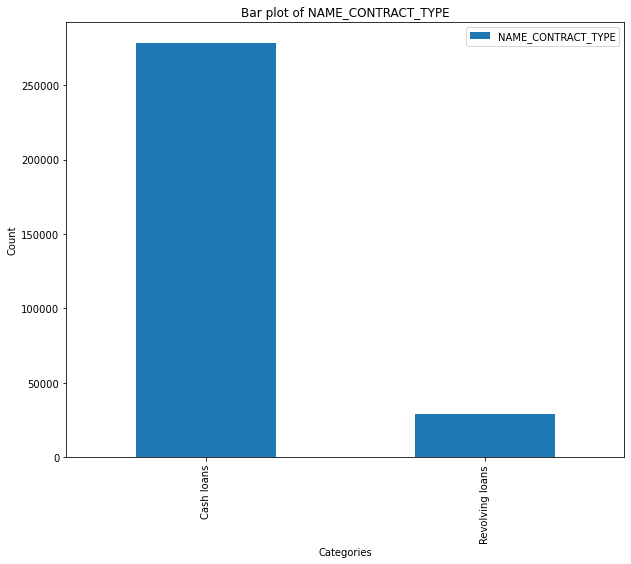

In [19]:
# Count plot for the selected feature
print(app_train['NAME_CONTRACT_TYPE'].value_counts())
plot_categorical_feature_count(app_train, feature_name = 'NAME_CONTRACT_TYPE', plot_bar = True, figsize = (10,8))

In [20]:
# Counts Pie plot with respect to Target variable
plot_categorical_wrt_target(app_train, feature_name = 'NAME_CONTRACT_TYPE', plot_pie = True)

**Observations:**

1. More than 90% of the loans applied for are cash loans. To be exact, only approx 30,000 loans are revolving. Revolving Loan is a special type of loan which allows the borrower with the ability to draw down or withdraw, repay, and withdraw again. 

2. Additionally, we can also see that most of the defaulters are for the cash loans. 

**Conclusions:**

We will primarily focus on the Cash loans for this data. 

##### <b>CODE_GENDER</b>

This is another one of the categorical features in the dataset. It is the gender of applicant. 

Let us have a look at the count for each category.

In [21]:
# Gender counts for the given data
app_train['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [22]:
# Pie Plot for the above data
plot_categorical_feature_count(app_train, 'CODE_GENDER', plot_pie = True, plot_bar = False, figsize = (10,8))

<Figure size 720x576 with 0 Axes>

In [23]:
# Plotting based on the Target Value
plot_categorical_wrt_target(app_train, 'CODE_GENDER', plot_pie = True, figsize = (12,10))

**Observations:**

1. There is an additional undefined category 'XNA' which is unwanted. Hence, we have to take care of these categories. 

2. Female applicant dominate in both the defaulters and non-defaulters category.

3. But, predicting such an important decision based on gender is not only wrong but discriminative. We cannot draw any concrete conclusions based on this alone. 

**Conclusions:**

The one major thing to do is to handle the XNA values. As they belong to the data of non-defaulters which is already more than 92% of the whole data, removing 4 datapoints wouldn't hurt us, Hence, we will do that.

##### <b> FLAG_OWN_CAR </b>

This flag tells us whether the applicant owns a car or not. We will now see the value count and also the plots for counts and also with respect to target. 

In [24]:
# Value Count for the selected feature
app_train['FLAG_OWN_CAR'].value_counts()

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

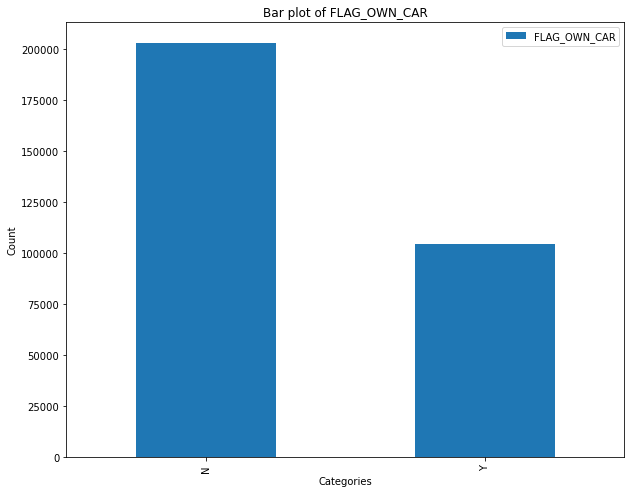

In [25]:
# Plotting a bar graph for this data
plot_categorical_feature_count(app_train, 'FLAG_OWN_CAR', figsize = (10,8))

<Figure size 1080x720 with 0 Axes>

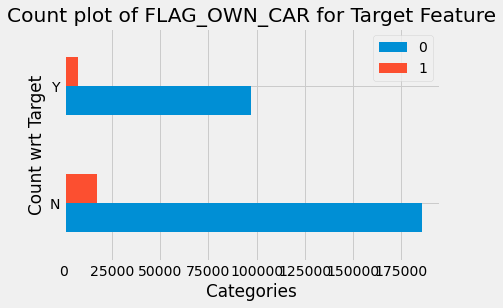

In [27]:
# Plotting the same with respect to Target feature
plot_categorical_wrt_target(app_train, 'FLAG_OWN_CAR', plot_count = True)

**Observations:**

1. There isn't much imbalance in the Y and N values for this particular feature. There are approx 200,000 people who do not own a car and 100,000 people own a car. 

2. As you can see from the second graph, people who do not own a car are more likely to default on their loan compared to those who do. 

**Conclusions:**

Based on the observations above, we can use this as a defining feature for our classification task.

##### <b> NAME_EDUCATION_TYPE </b> 

Next, we look at the following categorical variable. 

In [28]:
# Value Count for the selected feature
app_train['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

In [29]:
# Plotting a bar graph for this data
plot_categorical_feature_count(app_train, 'NAME_EDUCATION_TYPE', figsize = (10,8), plot_pie = True, plot_bar = False)

<Figure size 720x576 with 0 Axes>

In [30]:
# Plotting the same with respect to Target feature
plot_categorical_wrt_target(app_train, 'NAME_EDUCATION_TYPE', plot_count = False, plot_pie = True)

**Observations:**

1. There are 5 possible Educational qualifications in this data : from lower secondary to academic degree.

2. The dominating category is *secondary/secondary special* for both the Defaulters and non-Defaulters. The least occuring category is *Academic Degree* with only 164 occurences.

3. For deafulters, almost 80% of the people have just a secondary education. For non-defaulters, this value goes down by 10% but there are considerably more occurences with 92% of the data being of non-defaulters (target = 0).

**Conclusions:**

The similarity of the % values of each category for both defaulters and non defaulters is considerable. Hence, using this feature for prediction would be a defficult task based on the data provided to us. 

##### <b> OCCUPATION_TYPE </b>

Next, we will look into the 2 categories with the most number of unique values, starting with Occupation Type.

In [31]:
# Value Count for the selected feature
app_train['OCCUPATION_TYPE'].value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

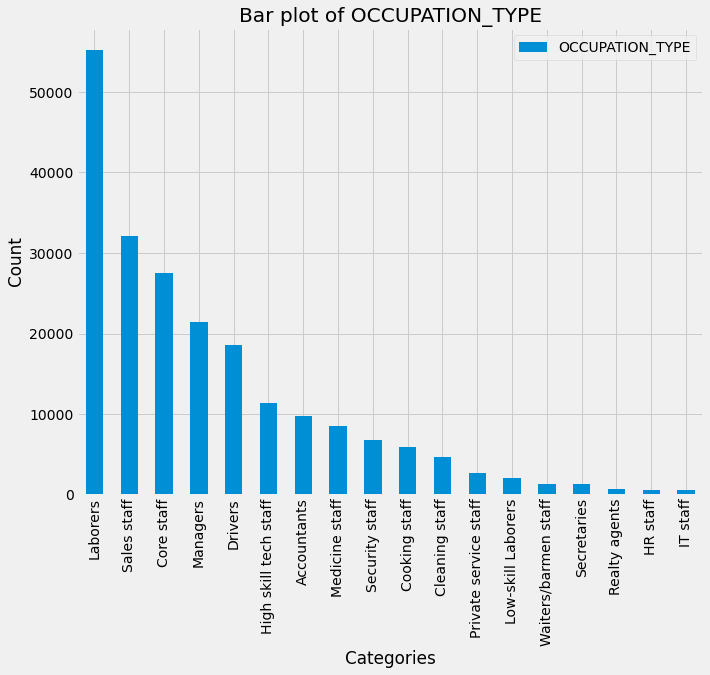

In [32]:
# Plotting a bar graph for this data
plot_categorical_feature_count(app_train, 'OCCUPATION_TYPE', figsize = (10,8), plot_pie = False, plot_bar = True)

In [33]:
# Plotting the same with respect to Target feature
plot_categorical_wrt_target(app_train, 'OCCUPATION_TYPE', plot_count = False, plot_pie = True, figsize=(20,20))

**Observations:**

1. There are 18 possible Occupations and each applicatant follows of the the following occupation. There are a wide array of occupations from Laborers to IT Staff. 

2. Most of the applications are filed by Laborers, which is the dominating category in both the cases.

3. Another interesting thing is when it comes to defaulters data, only the Laborers and Sales Staff make up almost half of all the available data. Hence, people in these occupation are more likely to default according to the provided data.

**Conclusions:**

This can prove to be an important feature as occupation is a very important thing to consider when making a decision to pass a loan, if we think practically. 

##### <b>ORGANIZATION_TYPE</b>

This is the last categorical feature we will analyse for this data.

In [34]:
# Value Count for the selected feature
print('There are {} unique categories for ORGANIZATION_TYPE Feature'.format(app_train['ORGANIZATION_TYPE'].nunique()))
print('')
app_train['ORGANIZATION_TYPE'].value_counts()

There are 58 unique categories for ORGANIZATION_TYPE Feature



Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

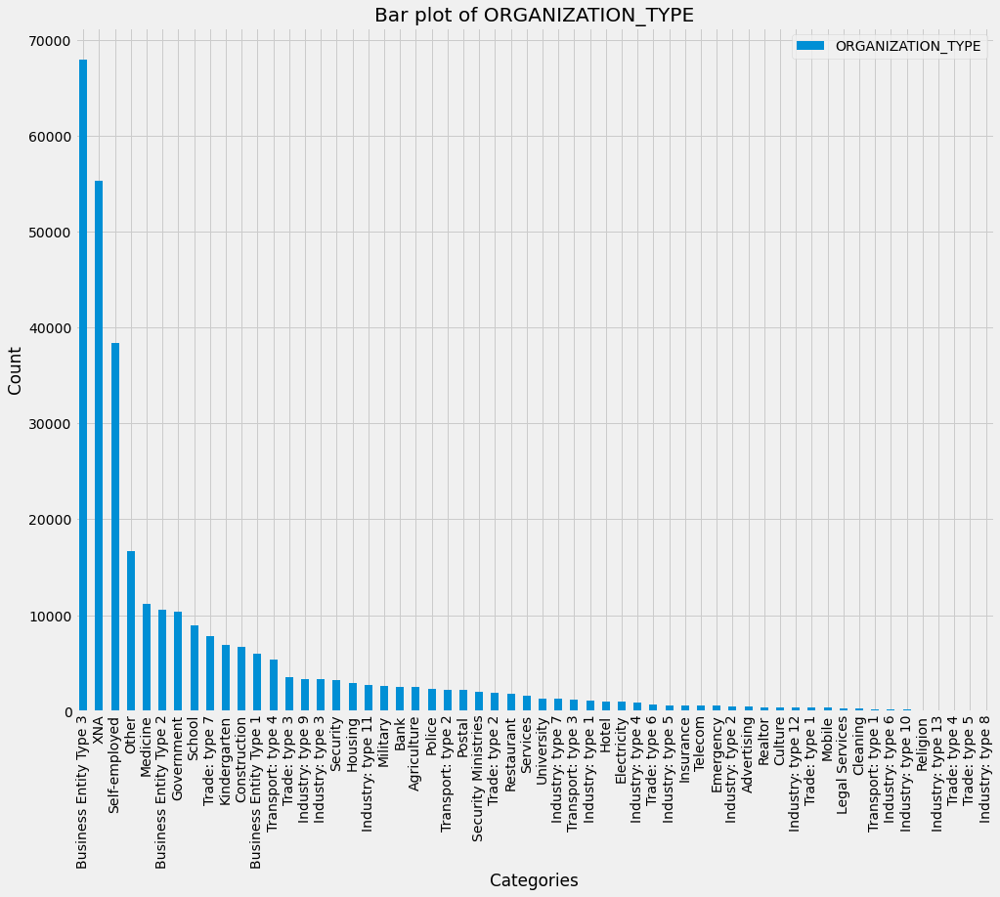

In [35]:
# Plotting a bar graph for this data
plot_categorical_feature_count(app_train, 'ORGANIZATION_TYPE', figsize = (15,12), plot_pie = False, plot_bar = True)

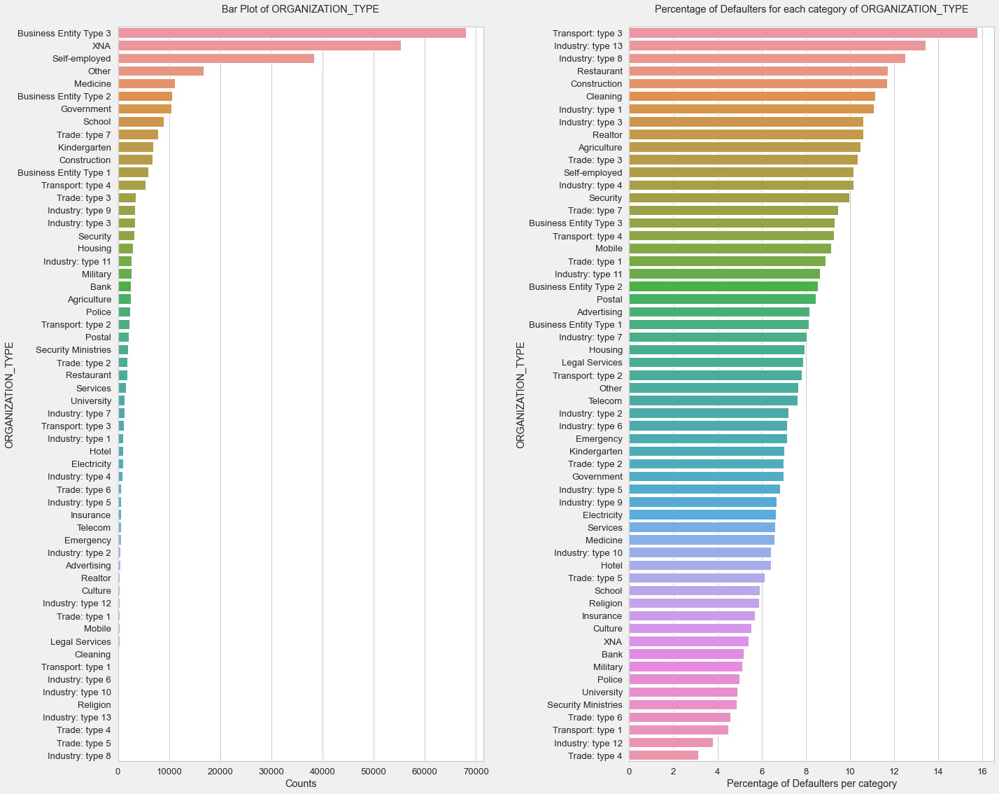

In [36]:

plt.figure(figsize = (20,18))
sns.set(style = 'whitegrid', font_scale = 1.2)
plt.subplots_adjust(wspace=0.40)

plt.subplot(1,2,1)
count_org = app_train.ORGANIZATION_TYPE.value_counts().sort_values(ascending = False)
sns.barplot(x = count_org, y = count_org.index)
plt.title('Bar Plot of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Counts')
plt.ylabel('ORGANIZATION_TYPE')

plt.subplot(1,2,2)
percentage_org = app_train[app_train.TARGET == 1].ORGANIZATION_TYPE.value_counts() * 100 / count_org
percentage_org = percentage_org.dropna().sort_values(ascending = False)
sns.barplot(x = percentage_org, y = percentage_org.index)
plt.title('Percentage of Defaulters for each category of ORGANIZATION_TYPE', pad = 20)
plt.xlabel('Percentage of Defaulters per category')
plt.ylabel('ORGANIZATION_TYPE')

plt.show()

**Observations:**

1. There are 58 possible Orginization types and each applicatant belongs to one of the the following organizations.

2. 'Business Entity Type 3' is the most dominating category as nearly 68,000 applicants has chosen this as their organization type.

3. Another interesting thing to note is that the second highest count is for the organization 'XNA' which is an undefined category and this is the same we found in the Gender Feature. They are actually already handled for us as all the undefined categories are given the name XNA and so no extra processing is required. 

4. Plotting Pie charts and Bar Plots with respect to Target using our function would be a very big and complex figure. Hence, we have done it manually using a seaborn bar plot.

5. The 2 bar plots give us a lot of interesting information. Firstly, about 15% of the deafulters have 'Transport Type 3' Organization, which is a considerable amount. The distribution help us understand whether applicants of a particular organization are more likely to default on their loan. 



##### <b> Overall Conclusion: </b>

*From the above analysis, we can conclude that there are some features which could make a significant impact in the predictions we make. Hence, we will choose those particular features as primary features for our Feature Engineering task as they will finally help us develop some really good features.*

Next, we move towards the analysis of Continuous or Numerical Features.

#### <b> 6. EDA of Continuous Features </b>

Next, we will see some plots about the continuous features for the application_train. I have chosen these select features after refering various discussion posts on Kaggle, Blogs, etc. 

To get more insight about the important features, we will plot a correlation matrix and visulize data features with a considerable relation with the Target feature.

Also, this will also help us understand correlation between 2 features.

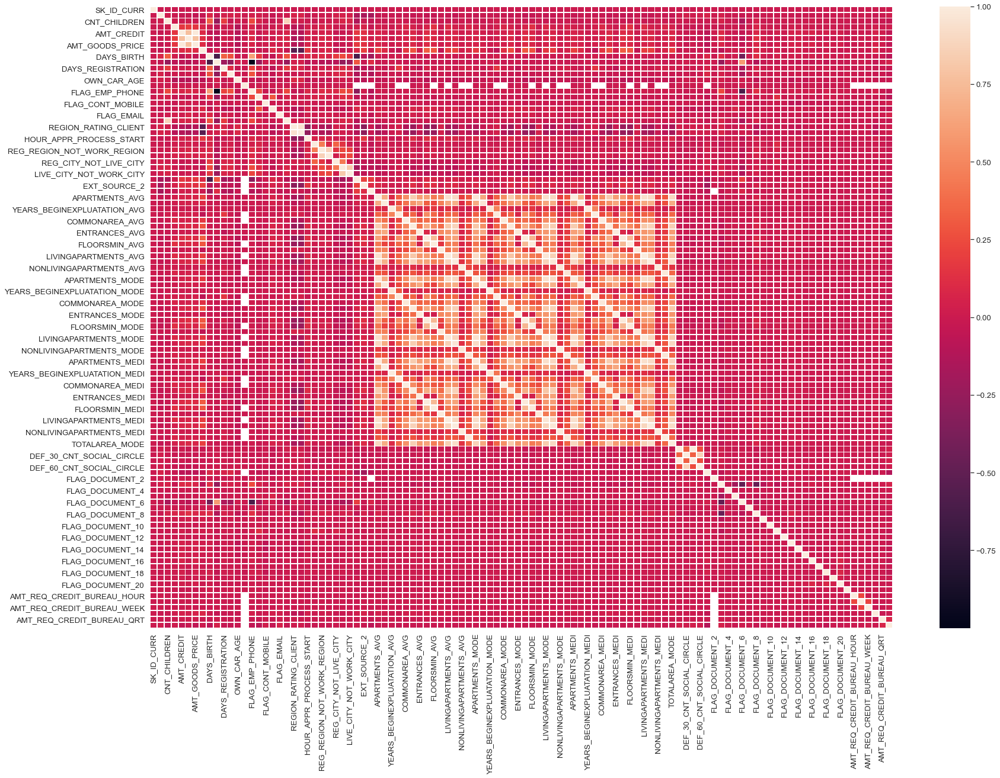

In [37]:
# Plotting the Correlation Matrix
corelations_app_train = compute_correlation(app_train, draw_matrix = True, annot = False, linewidths = 0.8, figsize = (25,18))

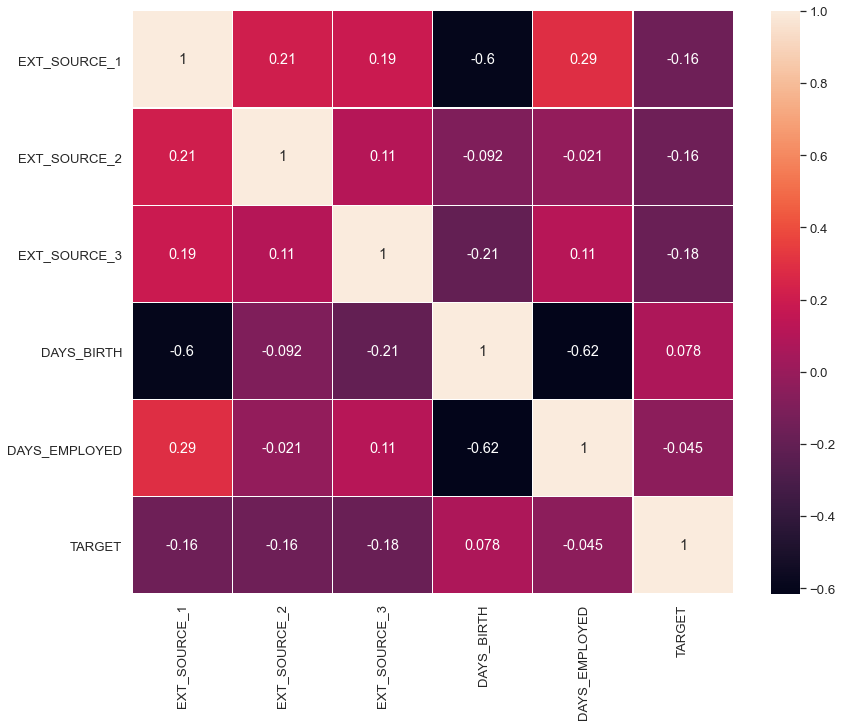

In [38]:
# We will select some important features based on the Literature Survey. 
selected_continuous_features = app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'TARGET']]
correlation_values_app_train = compute_correlation(selected_continuous_features, draw_matrix = True)

**Observations:**

1. We see that there are a lot of features which are correlated to each other, as seen from the first matrix. But, doing a detailed analysis would be both time consuming and not as fruitful because most correlation values are between -0.05 to 0.05.

2. There is a high correlation between 2 feature pairs:

* EXT_SOURCE_1 and DAYS_BIRTH (-0.6)
* DAYS_BIRTH and DAYS_EMPLOYED (-0.62)

  Hence, we will have to take care of this. This probably means that DAYS_BIRTH is one of the features based on which EXT_SOURCE_1 was calculated.

3. Hence, we will select some high correlation features with respect to target. We have selected the following features for analysis:

* All the EXT_SOURCE Features.
* DAYS_BIRTH (days passed since the birth of applicant (-ve values))
* DAYS_EMPLOYED ( for how many days a person is employed )

So, let's get started!

##### <b> EXT_SOURCE_1 </b>


count    134133.000000
mean          0.502130
std           0.211062
min           0.014568
25%           0.334007
50%           0.505998
75%           0.675053
max           0.962693
Name: EXT_SOURCE_1, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


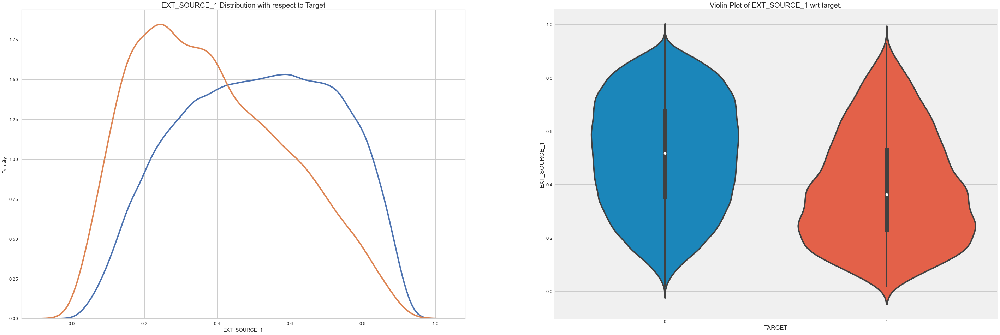

In [39]:
# Plot graphs for the selected continuous feature. 
plot_cont_feature(app_train, 'EXT_SOURCE_1', with_target = True, which_plots = ['dist', 'violin'], describe_data = True)

**Observations:**

1. The first thing we notice is that it is a normalized feature, which is given in the column description csv file. 

2. We can see a clear distinction in the values of this feature for defaulters and non-defaulters. 

3. The median value of this for non-defaulters is 0.5 and for the defaulters, it is around 0.35 according to the violin plot. There is a difference in the 25th and 75th percentile values too. 

4. Seeing the dist plot, we can clearly see that at 0.3 value of EXT_SOURCE_1, there is a peak for defaulters. The PDF for non defaulters resembles more of a plateau structure. 

**Conclusion:**

The major conclusion we draw is that this is a very important feature for us we will be using it a lot in feature engineering. It is so good that we can even use it as a primary feature. 

Also, one major conclusion we draw is that people with low EXT_SOURCE_1 value are more likely t become defaulters.

##### <b> EXT_SOURCE_2 </b>


count    3.068510e+05
mean     5.143927e-01
std      1.910602e-01
min      8.173617e-08
25%      3.924574e-01
50%      5.659614e-01
75%      6.636171e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


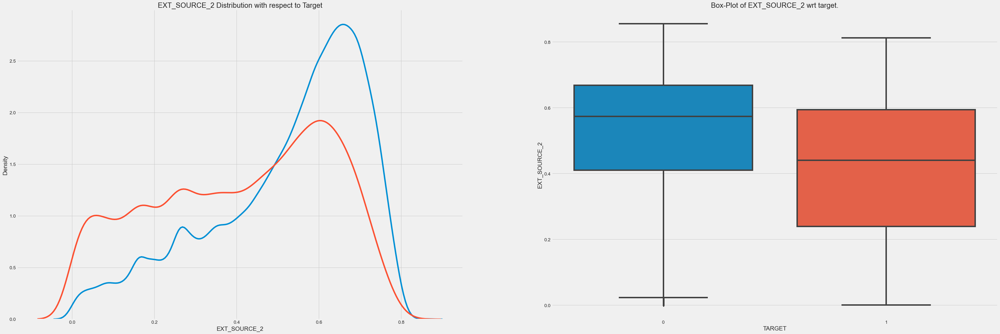

In [40]:
# Plot graphs for the selected continuous feature. 
plot_cont_feature(app_train, 'EXT_SOURCE_2', with_target = True, which_plots = ['dist', 'box'], describe_data = True)

**Observations:**

1. The first thing to notice is that it is not as easily seperable when compared to the previous case. 

2. The box plot shows us that the median value of this feature for defaulters is 0.45 (approx) whereas for non defaulters, this value increases to 0.55 (approx).

3. The peaks of both the PDFs are very close to each other which means that most values of this feature are same for both defaulters and non- defaulters.

4. But, the peak value for non-deafulters is note than defaulters. 

**Conclusions:**

We can draw the same conclusion as we did for EXT_SOURCE_1.

##### <b>EXT_SOURCE_3</b>

count    246546.000000
mean          0.510853
std           0.194844
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.896010
Name: EXT_SOURCE_3, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


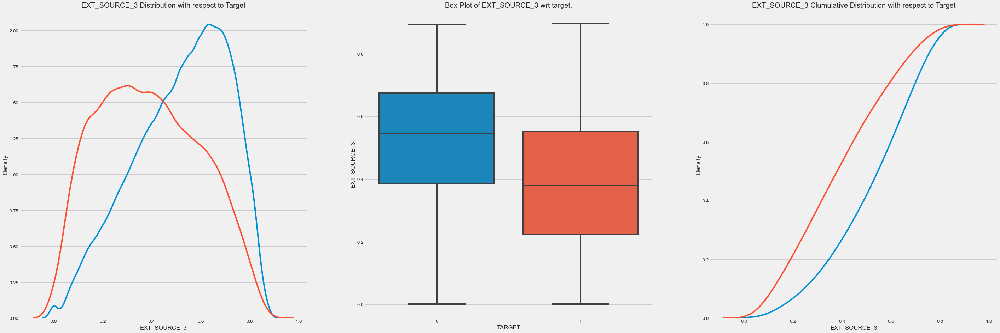

In [41]:
# Plot graphs for the selected continuous feature. 
plot_cont_feature(app_train, 'EXT_SOURCE_3', with_target = True, which_plots = ['dist', 'box', 'cdf'], describe_data = True)

**Observations:**

1. The plots are very similar to EXT_SOURCE_1 graphs. Moreover, their min and max values are also similar. The min value is 0 and max value is 0.896 for EXT_SOURCE_3.

2. We can easily seperate a range of values which occur the most for defauters only. For instance, seeing the dist plot, we can spot 2 peaks which are considerably distant.

3. The peak of defaulters is at 0.3 (again similar to EXT_SOURCE_1) and around 0.63 (approx) for non-defaulters. Another thing to note is that the peak of non-defaulters is more compared to that of defaulters. This indicates that there are more values of EXT_SOURCE_3 for non-defaulters.

**Conclusions:**

This is also a very important feature for our task. Interestingly, even tho its behaviour is very similar to EXT_SOURCE_1, the correlation value between the 2 is very less. 

##### <b>DAYS_BIRTH</b>

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: Age, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


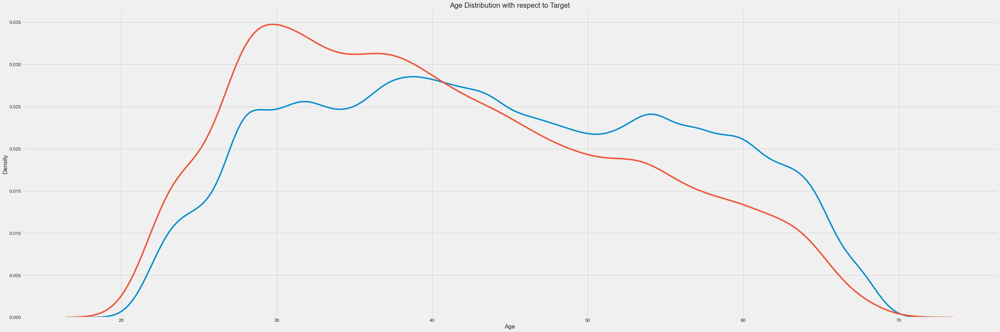

In [42]:
# Plot graphs for the selected continuous feature. 
app_train['Age'] = - app_train['DAYS_BIRTH'] / 365 
plot_cont_feature(app_train, 'Age', with_target = True, which_plots = ['dist'], describe_data = True)

**Observations:**

1. Instead of using the feature readily, we have created a new feature called age with is just the original feature multiplied by (-1/365).

2. The metrics are ok for this feature with the minimum age being 21 years and maximum age being 70 years. This is the typical age bracket for loan applicants. 

3. You can see that the red line (defaulter) distribution peaks at a early stage and the blue line follows a plateau like pattern, which means there are non-defaulters who are applicants of various age groups. 

**Conclusions:**

The main conclusion to draw is that younger people (below 40 years) tend to default more on their loans. 

Next, we will look at a distribution showing % of defaulters in each age group. 


Text(0.5, 1.0, 'Failure to Repay wrt Age')

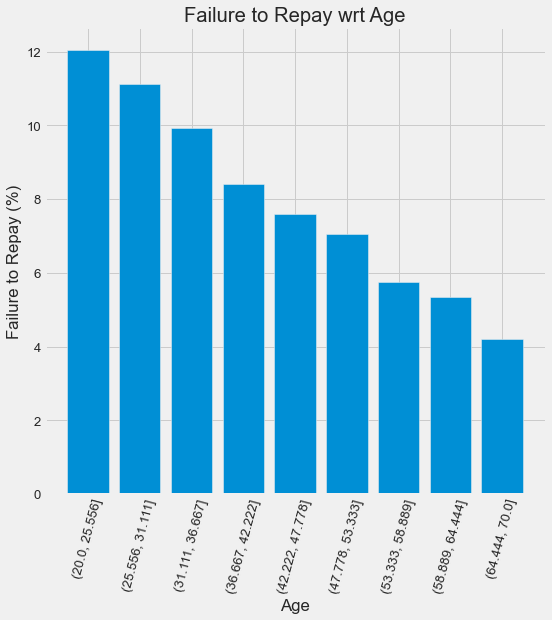

In [43]:
# Reference : https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction

binning_data = app_train[['TARGET', 'Age']]

# Bin the data
binning_data['Bins'] = pd.cut(binning_data['Age'], bins = np.linspace(20, 70, num = 10))
groups  = binning_data.groupby('Bins').mean()

plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(groups.index.astype(str), 100 * groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age')
plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay wrt Age')

##### <b>DAYS_EMPLOYED</b>

count    307511.000000
mean        174.835742
std         387.056895
min         -49.073973
25%          -7.561644
50%          -3.323288
75%          -0.791781
max        1000.665753
Name: Years_Employed, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


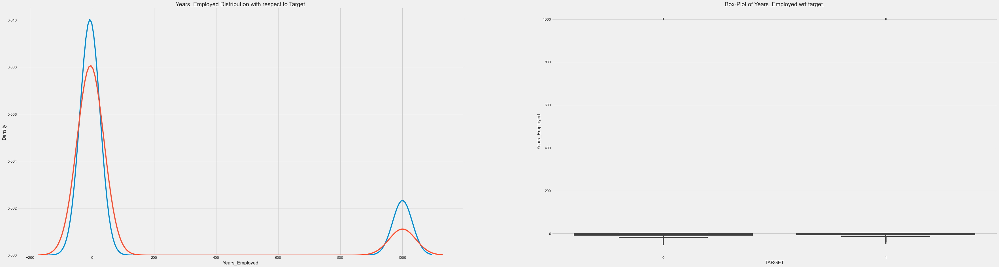

In [45]:
# Plot graphs for the selected continuous feature. 
app_train['Years_Employed'] = app_train['DAYS_EMPLOYED'] / 365 
plot_cont_feature(app_train, 'Years_Employed', with_target = True, which_plots = ['dist', 'box'], describe_data = True, figsize = (25,15))

**Observations:**

1. The most important and striking observation is that the maximum value of years employed is a 1000 years!! That is impossible, which means there are anamolies in the data. We need to figure out a way to handle them.

2. Most of the values are centered around zero in the dist plot both for defaulters and non defaulters other than the outliers. Seeing at the peak, there are probably a considerable number of applications with this value. 

3. The box plot also shows a similar result which most values -ve in sign, which is surprising as the years cant be a negative entity.

**Conclusions:**

We have to surely handle these anamolies in the data during pre processing. 

Another option we can opt for is to simply discard this feature as this has a high correlation value with the DAYS_BIRTH feature, which as we have seen in the previous section can be an important feature.

## Bureau and Bureau Balance

**bureau.csv**

All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.

**bureau_balance.csv**

Monthly balances of previous credits in Credit Bureau.
This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.

#### <b>1. Load the data</b>

In [46]:
# Using the Load Data Function
temp = load_csv_data(directory = '../data/', file_list = ['bureau.csv', 'bureau_balance.csv'])
# storing the dataframe into a variable
bureau = temp[0]
bureau_balance = temp[1]

Loading your 2 csv file(s), please wait...
All the csv files loaded into memory!
Time taken to load these data file(s) : 14.59 seconds


#### <b>2. Let us see some basic information about the both data files</b>

In [47]:
# Print out the Data Glimpse for the applcation train data
data_glimpse(bureau, 'bureau', col_dtypes=True)

The Shape of bureau is : (1716428, 17)
----------------------------------------------------------------------------------------------------
Columns in bureau :


Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE',
       'AMT_ANNUITY'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Types of columns present in the dataframe: 



float64    8
int64      6
object     3
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [48]:
# Print out the number of unique ID's in the dataframe
num_unique_id_curr = bureau['SK_ID_CURR'].nunique()
num_unique_id_bureau = bureau['SK_ID_BUREAU'].nunique()
print("There are {} unique values of SK_ID_CURR in bureau data: ".format(num_unique_id_curr))
print('-'*150)
print("There are {} unique values of SK_ID_BUREAU in bureau data: ".format(num_unique_id_bureau))

There are 305811 unique values of SK_ID_CURR in bureau data: 
------------------------------------------------------------------------------------------------------------------------------------------------------
There are 1716428 unique values of SK_ID_BUREAU in bureau data: 


In [49]:
# Print out the Data Glimpse for the applcation test data
data_glimpse(bureau_balance, 'bureau_balance', col_dtypes=True)

The Shape of bureau_balance is : (27299925, 3)
----------------------------------------------------------------------------------------------------
Columns in bureau_balance :


Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')
----------------------------------------------------------------------------------------------------
Types of columns present in the dataframe: 



int64     2
object    1
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [50]:
# Print out the number of unique ID's in the dataframe
num_unique_id = bureau_balance['SK_ID_BUREAU'].nunique()
print("There are {} unique values of SK_ID_BUREAU in bureau_balance.".format(num_unique_id))

There are 817395 unique values of SK_ID_BUREAU in bureau_balance.


**Observations:**

1. Firstly, we notice that there are multiple entries for each SK_ID_CURR. There are 3,07,000 unique ids and there are 17,16,428 rows in the bureau data.

2. Each row is categorized by a unique bureau id (SK_ID_BUREAU). This is the primary id for the bureau balance data.

3. Bureau data has 15 value columns (excluding the ids), out of with 3 are categorical features and the rest are numberical features. It basically has info about the previous loan each applicant applied for. 

4. The bureau balance data has just 2 feature columns. It has the monthy credit deatils for each loan in the bureau data. There is also a status feature which tells whether the loan is complete or not. 

Next,  Let us see how many columns have missing values and also plot a bar chart for better visualization. 


#### <b>3. Missing Values in the Dataset</b>

Your selected dataframe has 17 columns.
There are 7 columns that have missing values.


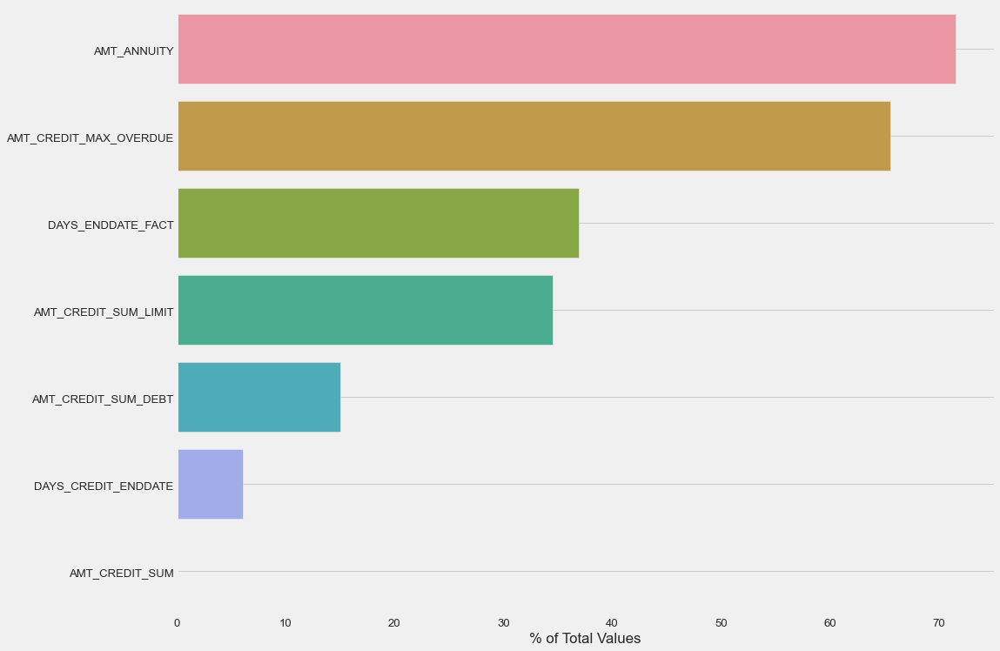

In [51]:
# Missing values in the dataframe and also show a bar plot. 
bureau_missing = missing_values_table_plot(bureau, plot_bar = True, figsize = (15,12))

In [52]:
# Printing the df for missing values
bureau_missing

,Missing Values,% of Total Values
AMT_ANNUITY,1226791,71.5
AMT_CREDIT_MAX_OVERDUE,1124488,65.5
DAYS_ENDDATE_FACT,633653,36.9
AMT_CREDIT_SUM_LIMIT,591780,34.5
AMT_CREDIT_SUM_DEBT,257669,15.0
DAYS_CREDIT_ENDDATE,105553,6.1
AMT_CREDIT_SUM,13,0.0


In [53]:
# Missing values in the test dataframe and also show a bar plot. 
bureau_bal_missing = missing_values_table_plot(bureau_balance, plot_bar = False, figsize = (15,12))

Your selected dataframe has 3 columns.
There are 0 columns that have missing values.
There are no missing values in the dataframe.


**Observations:**

1. There are 7 columns with missing values in the bureau data and no missing value columns in the bureau balance data.

2. AMT_ANNUITY has the greatest percentage of missing values with over 70% of the data points missing. AMT_CREDIT_MAX_OVERDUE is the next feature with around 65% values missing.

3. Apart from these, the rest of the columns do not have a large portion of values missing. No uther column has greater than 40% missing values. 

**Conclusion:**

Hence, we have to take care of the missing values, which we will be doing in the same way as before, by value Imputation. As you will see later, there are outliers in a lot of data columns, so we will be using median imputation and also process the data to remove outliers.

#### <b>4. Count based on Target Column</b>

In [54]:
# Add Target column to the bureau data
print("Merging TARGET column with bureau table")
bureau_merged = app_train[['TARGET', 'SK_ID_CURR']].merge(bureau, on = 'SK_ID_CURR', how = 'left')
print('Done!')
print("-"*100)
print(bureau_merged.columns)

Merging TARGET column with bureau table
Done!
----------------------------------------------------------------------------------------------------
Index(['TARGET', 'SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE',
       'CREDIT_CURRENCY', 'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
       'DAYS_CREDIT_ENDDATE', 'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE',
       'CNT_CREDIT_PROLONG', 'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT',
       'AMT_CREDIT_SUM_LIMIT', 'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE',
       'DAYS_CREDIT_UPDATE', 'AMT_ANNUITY'],
      dtype='object')


In [55]:
# Printing counts based on Target column
print("How many datapoints we have for each Target value :")
a = bureau_merged['TARGET'].value_counts().to_dict()
print('')
print("{} % of values are of target 0 ({})".format(round((a[0]*100/(a[0]+a[1])),2), a[0]))
print("{} % of values are of target 1 ({})".format(round((a[1]*100/(a[0]+a[1])), 2), a[1]))

How many datapoints we have for each Target value :

92.12 % of values are of target 0 (1390368)
7.88 % of values are of target 1 (118977)


In [56]:
# Pie Plot for the target column counts
plot_categorical_feature_count(bureau_merged, feature_name = 'TARGET', plot_pie = True, plot_bar = False)

<Figure size 864x720 with 0 Axes>

**Observations:**

1. The percentage values for each of the targets is very similat to that seen in the original app_train data. 92% data is of non-defaulters (target : 0) and 8% data is of defaulters (target : 1).

2. This implies a highly imbalanced data. So, we will have to develop a process to handle this condition.



#### <b>5. EDA of Categorical Features</b>


In [57]:
# Print the names of all the categorical features the dataframe has and print the number of unique values each has
bureau_merged.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

CREDIT_ACTIVE       4
CREDIT_CURRENCY     4
CREDIT_TYPE        15
dtype: int64

##### <b>CREDIT_ACTIVE</b>




Category based counts for CREDIT_ACTIVE :
Closed      917733
Active      541919
Sold          5653
Bad debt        20
Name: CREDIT_ACTIVE, dtype: int64
------------------------------------------------------------------------------------------------------------------------------------------------------


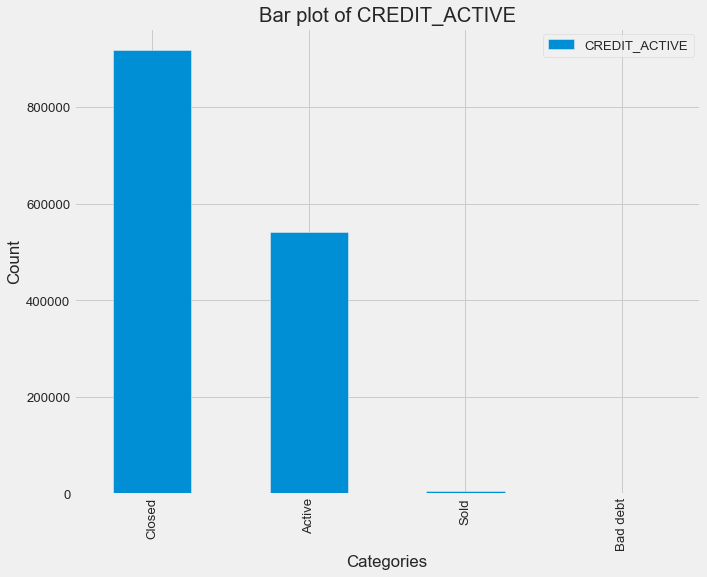

In [58]:
# Count plot for the selected feature
print('Category based counts for CREDIT_ACTIVE :')
print(bureau_merged['CREDIT_ACTIVE'].value_counts())
print('-'*150)
plot_categorical_feature_count(bureau_merged, feature_name = 'CREDIT_ACTIVE', plot_bar = True, figsize = (10,8))

In [59]:
# Counts Pie plot with respect to Target variable
plot_categorical_wrt_target(bureau_merged, feature_name = 'CREDIT_ACTIVE', plot_pie = True)

**Observations:**

1. There are 4 possible category values for the CREDIT_ACTIVE feature. This states whether the loan is still active or closed. The possible values are :

* Closed  (Paid and closed)
* Active  (Still active, not paid fully)
* Sold   (sold from one person to another)
* Bad Debt (Payment never received)

2. Most of the previous credits are either active or closed, more than 99% of the data.

3. Bad Debt occur very rarely as all the organizations providing a line of credit do their due diligence. Hence, there are only 20 cases in total out of the given 17 lakh data rows. 

**Conclusions:**

We will primarily focus on closed and active credit types. We can just ignore the bad debt data points as their affect of the data is almost negligible. 

Selling of credits from one party to another is also extremely rare and hence, we will disregard that too as it doesn't even make 1% of our data. 

##### <b>CREDIT CURRENCY</b>

In [60]:
# Gender counts for the given data
bureau_merged['CREDIT_CURRENCY'].value_counts()

currency 1    1464094
currency 2       1072
currency 3        150
currency 4          9
Name: CREDIT_CURRENCY, dtype: int64

In [61]:
# Pie Plot for the above data
plot_categorical_feature_count(bureau_merged, 'CREDIT_CURRENCY', plot_pie = True, plot_bar = False, figsize = (10,8))

<Figure size 720x576 with 0 Axes>

In [62]:
# Plotting based on the Target Value
plot_categorical_wrt_target(bureau_merged, 'CREDIT_CURRENCY', plot_pie = True, figsize = (12,10))

**Observations:**

1. There are 4 currency types in which a credit may be made available to the applicant. The type of currency is given by this feature.

2. More than 99%  values of this feature are for currency type 1. There are next to no cases where the type 2,3,4 currencies are given. 

3. The same trend is followed even when we take into regard the Target variable. One noteable observation is that no defaulter have opted for the 'currency type 4'. 

**Conclusions:**

After looking at the above plots, we can conclude that we will only consider all the currency type 1 values for our data training. 

##### <b> CREDIT_TYPE </b>
 

In [63]:
# Value Count for the selected feature
print('There are {} unique values for this feature.' .format(len(bureau['CREDIT_TYPE'].value_counts())))
bureau['CREDIT_TYPE'].value_counts()

There are 15 unique values for this feature.


Consumer credit                                 1251615
Credit card                                      402195
Car loan                                          27690
Mortgage                                          18391
Microloan                                         12413
Loan for business development                      1975
Another type of loan                               1017
Unknown type of loan                                555
Loan for working capital replenishment              469
Cash loan (non-earmarked)                            56
Real estate loan                                     27
Loan for the purchase of equipment                   19
Loan for purchase of shares (margin lending)          4
Mobile operator loan                                  1
Interbank credit                                      1
Name: CREDIT_TYPE, dtype: int64

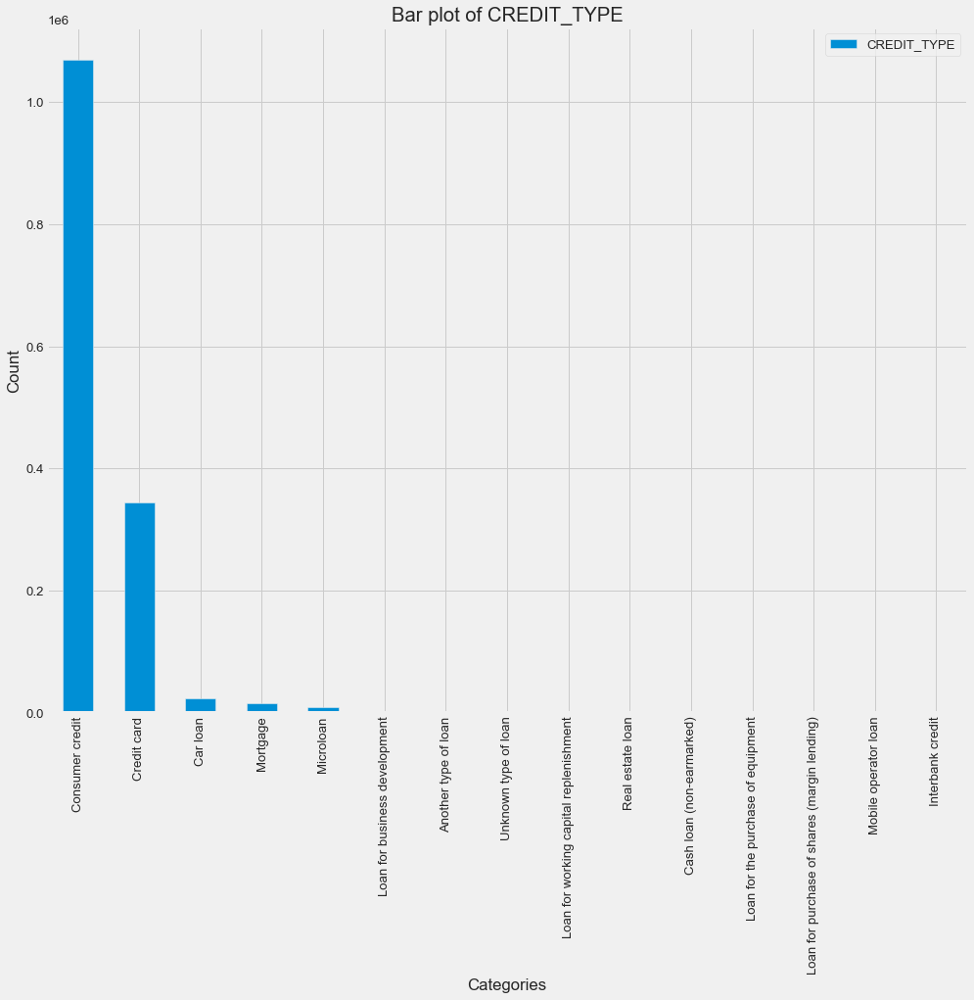

In [67]:
# Plotting a bar graph for this data
plot_categorical_feature_count(bureau_merged, 'CREDIT_TYPE', figsize = (15,12), plot_pie= False, plot_bar = True)

<Figure size 1080x720 with 0 Axes>

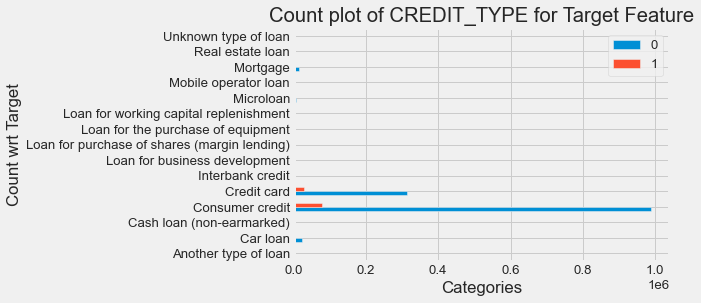

In [69]:
# Plotting the same with respect to Target feature
plot_categorical_wrt_target(bureau_merged, 'CREDIT_TYPE', plot_count = True)

**Observations:**

1. There are 15 possible types of credit loans given to the applicants of the data in their previous loans, reported to the credit bureau. 

2. Consumer credit and credit cards are most common type of credits opted by users, with 96.5% of the data compromising of just these 2 credit choices. 

3. Seeing the 2nd plot, we can see that the distribution for both the defaulters and non-defaulters is very similar, with just a difference of 3% in the aggreagate percentage of the 2 types dicussed in previous points. 

**Conclusions:**

From the observations, we may conclude that it would be a difficult task to use this variable as a primary feature as the distribution of values for both defaulters and non defaulters is pretty much the same. 

##### <b> Overall Conclusion </b>

*From the above analysis, it is very clear that most features in this data cannot be used as primary features as there is no clear distinction of values for defaulters and non-defaulters.*

*We will have to apply some feature engineering techniques to use these features for training our model, which we will be doing in the next section. Also, we may drop a feature from the bureau data as it have over 70% of its values missing (AMT_ANNUITY) if it does not turn out to be that important during the feature engineering process.*

Next, we move towards the analysis of Continuous or Numerical Features.

#### <b> 6. EDA of Continuous Features </b>

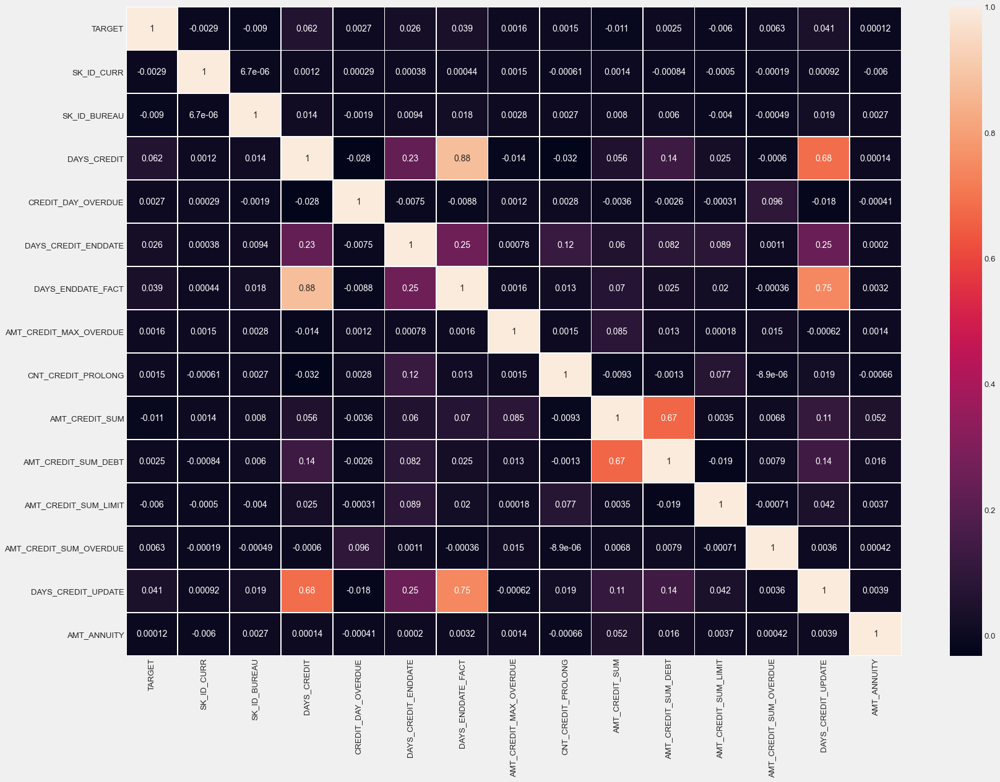

In [70]:
# Plotting the Correlation Matrix
corelations_bureau = compute_correlation(bureau_merged, draw_matrix = True, annot = True, linewidths = 0.8, figsize = (25,18))

**Observations:**

1. First observation we can make is that no particular feature has a correlation greater than 0.1 with the **target** feature, which means we cannot use these as is for model training. 

2. There are some features which are highly correlated to other features. They are:

* DAYS_CREDIT and DAYS_CREDIT_UPDATE (0.68)
* DAYS_CREDIT_UPDATE and DAYS_ENDDATE_FACT (0.75)
* AMT_CREDIT_SUM_DEBT and AMT_CREDIT_SUM (0.67)
* DAYS_ENDDATE_FACT and DAYS_CREDIT (0.88)

Hence, we will analyse these following categories now. So, let's get started!

##### <b> DAYS_CREDIT_UPDATE </b>


count    1.465325e+06
mean     1.643252e+00
std      2.019455e+00
min     -1.019178e+00
25%      9.041096e-02
50%      1.112329e+00
75%      2.476712e+00
max      1.149233e+02
Name: YEARS_CREDIT_UPDATE, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


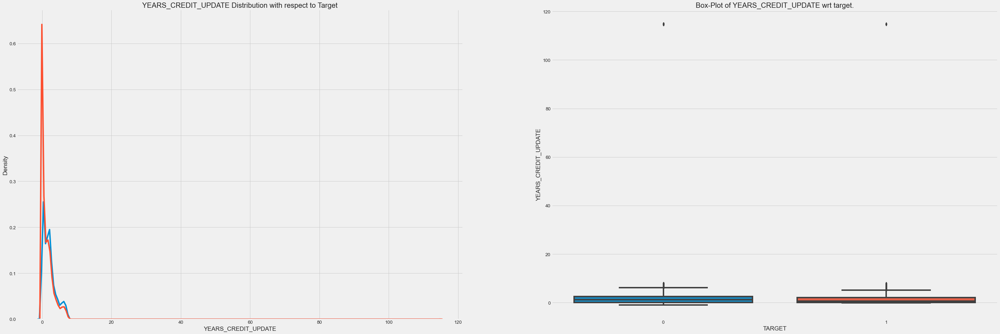

In [71]:
# Plot graphs for the selected continuous feature. 
# create a new column in the data to store the number of years instead of days.
bureau_merged['YEARS_CREDIT_UPDATE'] = bureau_merged['DAYS_CREDIT_UPDATE'] * (-1/365)
plot_cont_feature(bureau_merged, 'YEARS_CREDIT_UPDATE', with_target = True, which_plots = ['dist', 'box'], describe_data = True)

As, you can see, the maximum value in this case is 120 years, which is not possible. Hence, this data has outliers. We will try to limit our values to get a proper visualization.

Number of rows in the original data :  1509345
Number of rows in the sliced data :  1465230


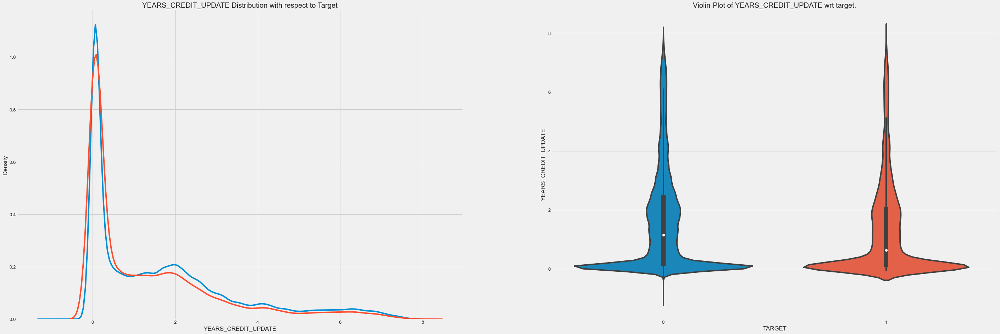

In [73]:
# Limit the value of the feature
df = bureau_merged.loc[bureau_merged['YEARS_CREDIT_UPDATE'] < 10]
print("Number of rows in the original data : ",bureau_merged.shape[0])
print("Number of rows in the sliced data : ",df.shape[0])
# Now, plotting the graph again
plot_cont_feature(df, 'YEARS_CREDIT_UPDATE', with_target = True, which_plots = ['dist','violin'], describe_data = False)

**Observations:**

1. First thing to notice is that the modified feature gives us the number of years instead of the number of days given by the primary feature.

2. Another interesting thing is the presence of anamolies or outliers in the data. The max no. of years for instance at around 120, which is not possible. It must be a typing mistake or wrong entry. 

3. Most values are in the range of 0-1 year as the violin plot width is maximum for that values. 

4. Less than 1% data is sliced when we added a condition that no value greater than 10 years must be selected, which indicates that the number of outliers are very less for this data.

5. Coming to the updated violin plot, we can see some distintion between the median values for defaulters and non-defaulters. Defaulters tend to have a lesser duration left but this is just for the data provided to us. 


**Conclusions:**

No clear distinction between defaulters and non-defaulters. 

Also, outliers very less so they can be easily handled by removal too if needed.

##### <b> AMT_CREDIT_SUM </b>


count    1.465322e+06
mean     3.516889e+05
std      1.078009e+06
min      0.000000e+00
25%      5.116500e+04
50%      1.246981e+05
75%      3.082500e+05
max      3.960000e+08
Name: AMT_CREDIT_SUM, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


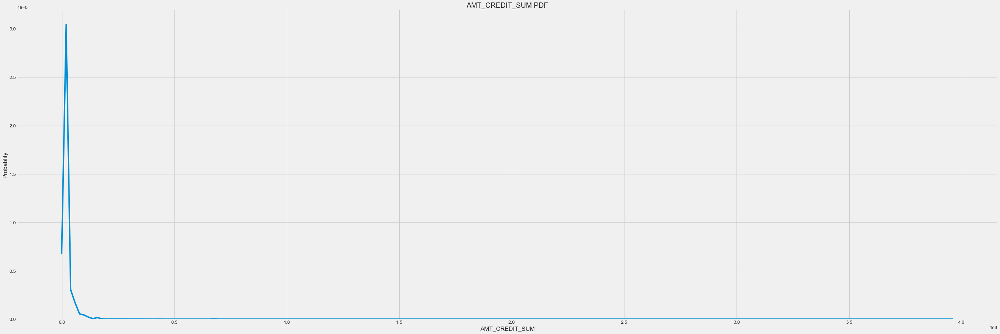

In [74]:
# Plot graphs for the selected continuous feature. 
plot_cont_feature(bureau_merged, 'AMT_CREDIT_SUM', with_target = False, which_plots = ['dist'], describe_data = True)

As seen from the above data, the mean of this feature is in the range of 10^5 but the maximum value is of the order 10^8. Hence, that must be a rare occurence. Let check how rare.

In [75]:
# Check rows with a feature value of the order 10^8
df = bureau_merged.loc[bureau_merged['AMT_CREDIT_SUM'] > (1 * 10**8)]
print('There are {} instances where the Credit amount is great than 10 million.'.format(df.shape[0]))

There are 18 instances where the Credit amount is great than 10 million.


Hence, this is a very small number when compared with the total number of rows in our data. For the sake of plotting, we will just limit our feature value to get a better plot. 

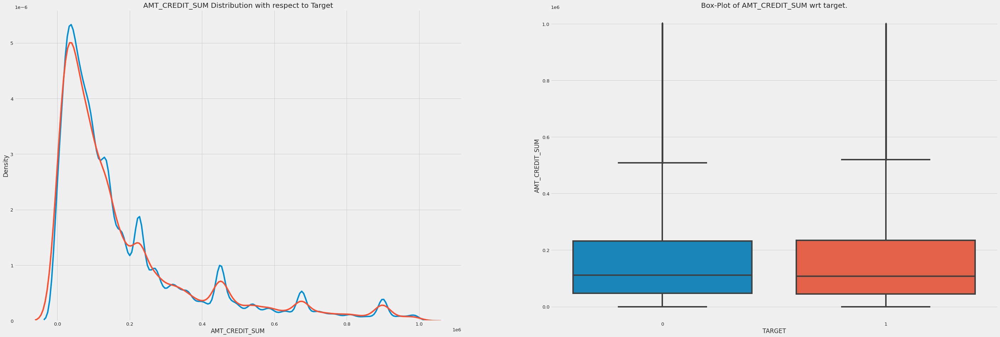

In [71]:
# Limiting the value and plotting the dist plot again.
df = bureau_merged.loc[bureau_merged['AMT_CREDIT_SUM'] < (1* 10**6)]
plot_cont_feature(df, 'AMT_CREDIT_SUM', with_target = True, which_plots = ['dist', 'box'], describe_data = False)

**Observations:**

1. First thing to notice is there are some amounts which are much more than the mean amount of all the data. There are 18 such instances to be exact.

2. After scaling the values, we got a much better visualization of the values. The Dist plot shows just how difficult it would be for use to differentiate between the defaulters and non-defaulters just by looking at the credit amount, which is understandable.

3. Box plot for both the defaulters and non-defaulters is almost identical.

**Conclusion:**

This would no doubt be an important feature when *creating new features* as the amount of credit is a very important attribute in general. 

But, using it as is would not be possible as there is no distinguishing trend for defaulters and non-defaulters. Also, there are some anamolies in the data which need to be handled.


##### <b>DAYS_ENDDATE_FACT</b>

Remaining duration of CB credit (in days) at the time of application in Home Credit.

count    920652.000000
mean          2.802097
std           1.968142
min          -0.000000
25%           1.169863
50%           2.465753
75%           4.117808
max         115.131507
Name: REMAINING_YEARS_CREDIT, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


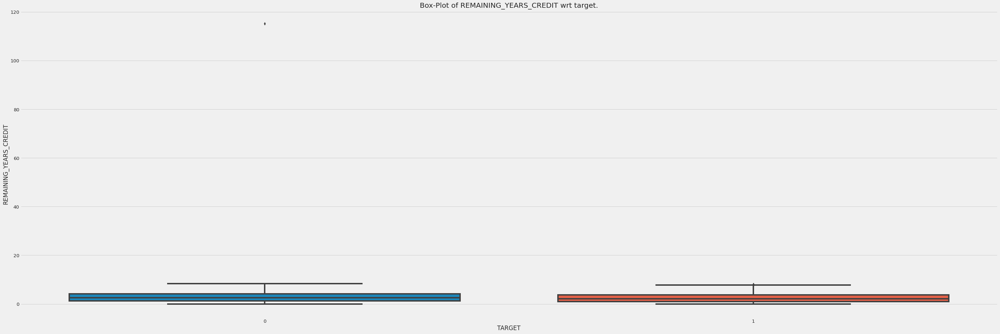

In [72]:
# Plot graphs for the selected continuous feature. 
# Converting the -ve days value into +ve years 
bureau_merged['REMAINING_YEARS_CREDIT'] = bureau_merged['DAYS_ENDDATE_FACT'] * (-1/365)
plot_cont_feature(bureau_merged, 'REMAINING_YEARS_CREDIT', with_target = True, which_plots = ['box'], describe_data = True)

As, you can see, the maximum value in this case is 115 years, which is not possible. Hence, this is an outlier in our data. We will try to limit our values to get a proper visualization.


Number of rows in the original data :  1509345
Number of rows in the sliced data :  920651


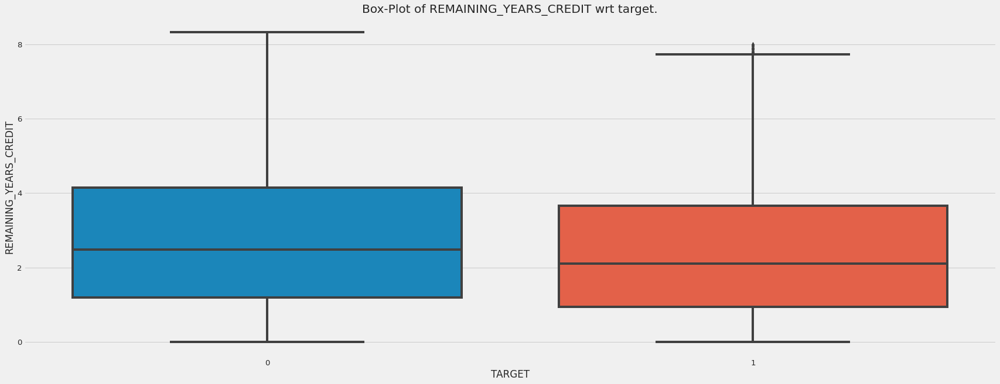

In [73]:
# Limit the value of the feature
df = bureau_merged.loc[bureau_merged['REMAINING_YEARS_CREDIT'] < 40]
print("Number of rows in the original data : ",bureau_merged.shape[0])
print("Number of rows in the sliced data : ",df.shape[0])
# Now, plotting the graph again
plot_cont_feature(df, 'REMAINING_YEARS_CREDIT', with_target = True, which_plots = ['box'], describe_data = False, figsize = (12,10))

**Observations:**

1. First thing to notice is that the modified feature gives us the number of years left for the previous credit, computed at the time of application. 

2. Another interesting thing is the presence of anamolies or outliers in the data. The max no. of years for instance are 115, which is not possible. It must be a typing mistake or wrong entry. 

3. The number of anamolies must be very less as the median and mean of the data is very similar. As mean is heavily affected when the number of outliers are more, we can say that this number must be very less. 

4. Coming to the updated box plot, we can see some distintion between the median values for defaulters and non-defaulters. Defaulters tend to have a lesser duration left but this is just for the data provided to us.  

**Conclusions:**

There are significantly a lot of rows where the number of years left in the loan are greater than 40, which is not rare but highly unlikely. We need to process this data in some way to create some better features. 

## Previous Application 

**About the Data :**

This data contains all the previous loan application data of the applicant with Home Credit. 

Each row indicates a previous application. A curr_id can have multiple previous applications and each row has a unique id called SK_ID_PREV. 

It has 3 other data files liked via the SK_ID_PREV which are :

* Credit Card Balance
* Installments Payment
* POS_Cash Balance

We will discuss them in detail in the next sections. 

###### <b>Loading the Data</b>

In [76]:
# loading the selected data file from memory
temp = load_csv_data(directory = '../data/', file_list = ['previous_application.csv'])
prev_app = temp[0]

Loading your 1 csv file(s), please wait...
All the csv files loaded into memory!
Time taken to load these data file(s) : 15.9 seconds


###### <b>Basic info about the data</b>


In [75]:
# Getting the basic info using the data glimpse function
data_glimpse(prev_app, 'previous_application', col_dtypes = True)

The Shape of previous_application is : (1670214, 37)
----------------------------------------------------------------------------------------------------
Columns in previous_application :


Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
   

object     16
float64    15
int64       6
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
# Now, we will look more about the ids it has.
print('There are {} unique SK_ID_CURR values.'.format(prev_app['SK_ID_CURR'].nunique()))
print('There are {} unique SK_ID_PREV values.'.format(prev_app['SK_ID_PREV'].nunique()))

print('-'*100)

# How many SK_ID_CURR values are common for both dataframes.
print('Number of overlapping SK_ID_CURR are: {}'.format(len(set(app_train.SK_ID_CURR.unique()).intersection(set(prev_app.SK_ID_CURR.unique())))))

There are 338857 unique SK_ID_CURR values.
There are 1670214 unique SK_ID_PREV values.
----------------------------------------------------------------------------------------------------
Number of overlapping SK_ID_CURR are: 291057


**Observations:**

1. There are 1670214 rows for previous loan applications and there 37 column values for each row. 

2. Out of the 37 columns, two is id columns, 16 categorical features and the rest are numerical/continuous features. 

3. There are 338857 unique SK_ID_CURR values, out of which 291057 are in the application_train data too. Rest of them must belong to application_test data. 



###### <b> Missing Values </b>

Your selected dataframe has 37 columns.
There are 16 columns that have missing values.


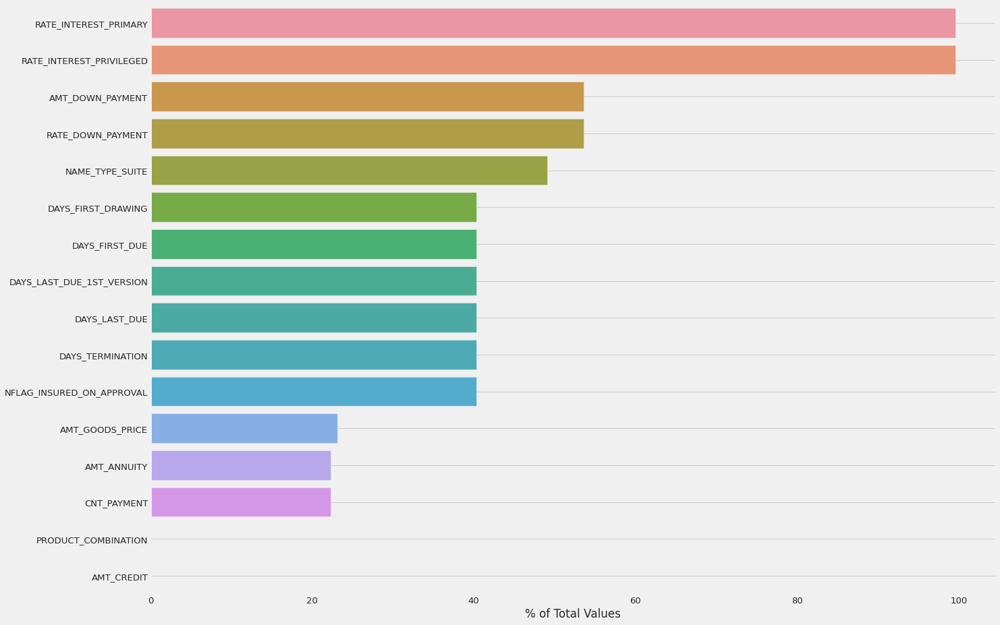

In [77]:
# Missing value table using our custom function
missing_prev_app = missing_values_table_plot(prev_app, plot_bar = True)

In [78]:
# Printing the table we just got
missing_prev_app

,Missing Values,% of Total Values
RATE_INTEREST_PRIMARY,1664263,99.6
RATE_INTEREST_PRIVILEGED,1664263,99.6
AMT_DOWN_PAYMENT,895844,53.6
RATE_DOWN_PAYMENT,895844,53.6
NAME_TYPE_SUITE,820405,49.1
DAYS_FIRST_DRAWING,673065,40.3
DAYS_FIRST_DUE,673065,40.3
DAYS_LAST_DUE_1ST_VERSION,673065,40.3
DAYS_LAST_DUE,673065,40.3
DAYS_TERMINATION,673065,40.3


**Observations:**

1. There are 16 columns in the data with missing values. 

2. The Rate_Interest columns have almost all its values missing with 99.6% missing values. It would be unlikely that we get any data from these so we have to take care of that.

3. All Days_ features have the same number of missing values, which means they are probably about the same entity. 


###### <b> Count based on the Target variable </b>

In [78]:
# Merging the target column
print("Merging TARGET column with Previous Application Data")
prev_app = app_train[['TARGET', 'SK_ID_CURR']].merge(prev_app, on = 'SK_ID_CURR', how = 'left')
print('Done!')
print("-"*100)
print(prev_app.columns)

Merging TARGET column with Previous Application Data
Done!
----------------------------------------------------------------------------------------------------
Index(['TARGET', 'SK_ID_CURR', 'SK_ID_PREV', 'NAME_CONTRACT_TYPE',
       'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT',
       'AMT_GOODS_PRICE', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT',
       'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE',

In [79]:
# Printing counts based on Target column
print("How many datapoints we have for each Target value :")
a = prev_app['TARGET'].value_counts().to_dict()
print('')
print("{} % of values are of target 0 ({})".format(round((a[0]*100/(a[0]+a[1])),2), a[0]))
print("{} % of values are of target 1 ({})".format(round((a[1]*100/(a[0]+a[1])), 2), a[1]))

How many datapoints we have for each Target value :

91.38 % of values are of target 0 (1306815)
8.62 % of values are of target 1 (123340)


In [80]:
# Pie Plot for the target column counts
plot_categorical_feature_count(prev_app, feature_name = 'TARGET', plot_pie = True, plot_bar = False)

<Figure size 864x720 with 0 Axes>

**Observations:** 

There isn't much to notice as this is the same behaviour we saw in all the data files we analysed before.

###### <b> Correlation Matrix </b>


Before moving on with the EDA of all the columns, we will first see the correlation matrix. 

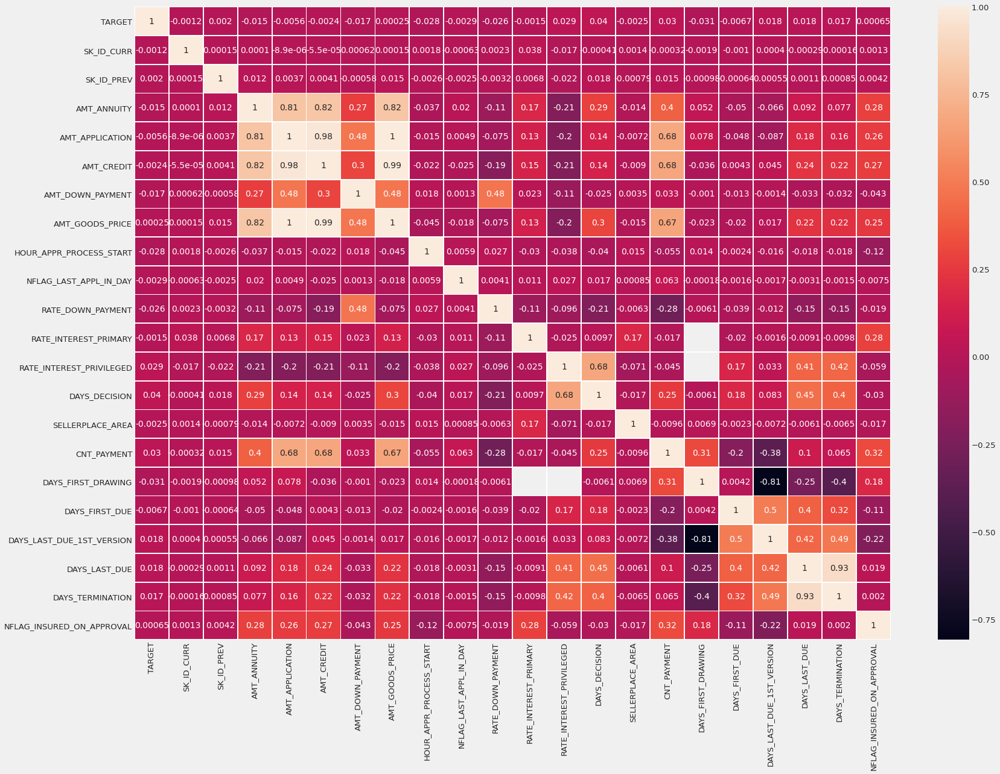

In [82]:
# Plotting the Correlation Matrix
corelations_prev_app = compute_correlation(prev_app, draw_matrix = True, annot = True, linewidths = 0.8, figsize = (25,18))

**Observations:**

1. All AMT_ features have a very high correlation values with some values having a correlation of 1. 

2. There are no features with even a moderate correlation to our Target variable. 

3. Some DAYS_ Features also have medium to high correlation.

4. Another interesting observation is that all high correlation values are positive so the related variable will increase as the primary feature value increases.

5. There is a single high -ve correlation value of -0.81 between DAYS_LAST_DUE_FIRST_VERSION and DAYS_FIRST_DRAWING.

##### <b> Categorical Features EDA </b>

In [83]:
# Print out all the names of categorical features. Also print unique categories each of them have
prev_app.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE              4
WEEKDAY_APPR_PROCESS_START      7
FLAG_LAST_APPL_PER_CONTRACT     2
NAME_CASH_LOAN_PURPOSE         25
NAME_CONTRACT_STATUS            4
NAME_PAYMENT_TYPE               4
CODE_REJECT_REASON              9
NAME_TYPE_SUITE                 7
NAME_CLIENT_TYPE                4
NAME_GOODS_CATEGORY            27
NAME_PORTFOLIO                  5
NAME_PRODUCT_TYPE               3
CHANNEL_TYPE                    8
NAME_SELLER_INDUSTRY           11
NAME_YIELD_GROUP                5
PRODUCT_COMBINATION            17
dtype: int64

###### <b> NAME_CONTRACT_TYPE </b>

In [81]:
# Count plot for the selected feature
print('Category based counts for NAME_CONTRACT_TYPE :')
print(prev_app['NAME_CONTRACT_TYPE'].value_counts())
print('-'*100)
plot_categorical_feature_count(prev_app, feature_name = 'NAME_CONTRACT_TYPE', plot_pie = True, plot_bar = False, figsize = (10,8))

Category based counts for NAME_CONTRACT_TYPE :
Cash loans         626764
Consumer loans     625256
Revolving loans    161368
XNA                   313
Name: NAME_CONTRACT_TYPE, dtype: int64
----------------------------------------------------------------------------------------------------


<Figure size 720x576 with 0 Axes>

In [82]:
# Counts Pie plot with respect to Target variable
plot_categorical_wrt_target(prev_app, feature_name = 'NAME_CONTRACT_TYPE', plot_pie = True)

**Observations:**

1. There are 4 possible category values for the NAME_CONTRACT_TYPE feature. This states the type of loan for which the applicant applied. The possible values are :

* Cash Loan 
* Reolving Loan  
* Consumer Loan
* XNA (undefined)

2. Roughly 88% of the data has only 2 types of loans, cash loans and consumer loans.The rest are revolving loans.

3. There are 313 instances where the type of loan is undefined. This may be error and needs to be taken care of.

4. Another interesting thing to note is that defaulters tend to default more on cash loans ( almost 47% ) compared to all the other types.
Hence, we can take some extra precautions for cash loan applicants. 

5. Another interesting thing to note is that there were only 2 types of loan applications in the main application data, that is consumer and revolving loans. So, this data can help us.

**Conclusions:**

We will focus on mostly the cash and consumer loan applications of this data and also revolving loans as they are a part of the main application data. 

We will handle XNA data by simply removing these rows as they dont even make up 1% of the data.

###### <b>NAME_CONTRACT_STATUS</b>

Contract status on the previous credit

Category based counts for NAME_CONTRACT_STATUS :
Approved        886099
Canceled        259441
Refused         245390
Unused offer     22771
Name: NAME_CONTRACT_STATUS, dtype: int64
----------------------------------------------------------------------------------------------------


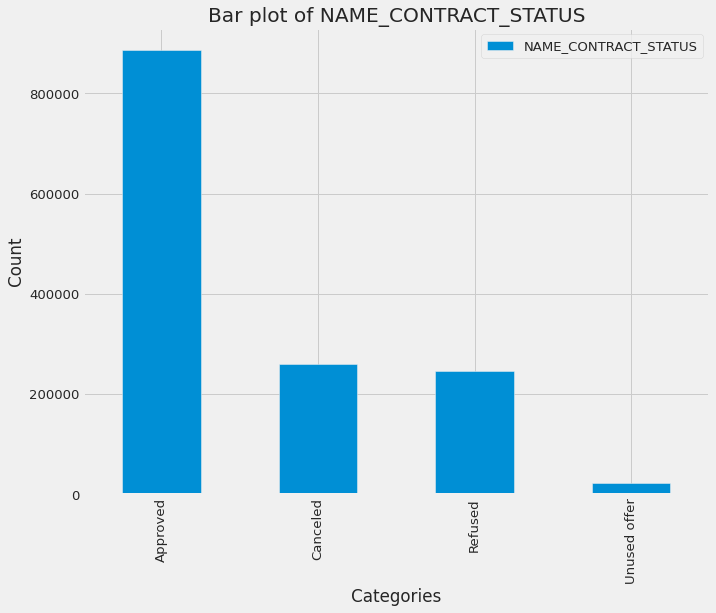

In [86]:
# Count plot for the selected feature
print('Category based counts for NAME_CONTRACT_STATUS :')
print(prev_app['NAME_CONTRACT_STATUS'].value_counts())
print('-'*100)
plot_categorical_feature_count(prev_app, feature_name = 'NAME_CONTRACT_STATUS', plot_bar = True, figsize = (10,8))

In [83]:
# Counts Pie plot with respect to Target variable
plot_categorical_wrt_target(prev_app, feature_name = 'NAME_CONTRACT_STATUS', plot_pie = True)

**Observations:**

1. There are 4 possible category values for the NAME_CONTRACT_STATUS feature. This states the status of loan for which the applicant applied. The possible values are :

* Approved 
* Cancelled  
* Unused Offer
* Rejected

2. Due to data imbalance, there is a lot less data for the defaulters. One thing to notice that people who had their previous loans Rejected tend to default more with 24% such cases for defaulters and only 16% for non-defaulters. This is solely based on the data provided to us. 

3. Approved Loans are dominating in both the cases so we have to take that into account too that a person may be a first time defaulter and so we need to widen our search into the reasons he might have done that. 


###### <b>CODE_REJECT_REASON</b>
Why was the previous application rejected

In [84]:
# Count plot for the selected feature
print('Category based counts for CODE_REJECT_REASON :')
print(prev_app['CODE_REJECT_REASON'].value_counts())
print('-'*100)
plot_categorical_feature_count(prev_app, feature_name = 'CODE_REJECT_REASON', plot_bar = False,  plot_pie = True, figsize = (10,8))

Category based counts for CODE_REJECT_REASON :
XAP       1145533
HC         145984
LIMIT       47773
SCO         32636
CLIENT      22771
SCOFR       10875
XNA          4378
VERIF        3079
SYSTEM        672
Name: CODE_REJECT_REASON, dtype: int64
----------------------------------------------------------------------------------------------------


<Figure size 720x576 with 0 Axes>

In [85]:
# Counts Pie plot with respect to Target variable
plot_categorical_wrt_target(prev_app, feature_name = 'CODE_REJECT_REASON', plot_pie = True)

**Observations:**

Approved previous application have CODE_REJECT_REASON mainly as XAP (1036773 rows), so according to this, XAP may be just placeholder as Approved?


there are 26436 rows of unused offere, which has a CODE_REJECT_REASON as CLIENT.

and for those which are rejected previous applications, they have HC, LIMIT, SCO, SCOFR, XNA, VERIF, SYSTEM as CODE_REJECT_REASON

XNA appear when the loan is a cash loan, so this is also a placeholder as NA.

* Reference : https://www.kaggle.com/c/home-credit-default-risk/discussion/58209

###### <b> Channel Type </b>

Through which channel we acquired the client on the previous application

In [86]:
# Count the number of occurences of each category 
plot_categorical_feature_count(prev_app, 'CHANNEL_TYPE', plot_pie = True, plot_bar = False, figsize=(15,12))

<Figure size 1080x864 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

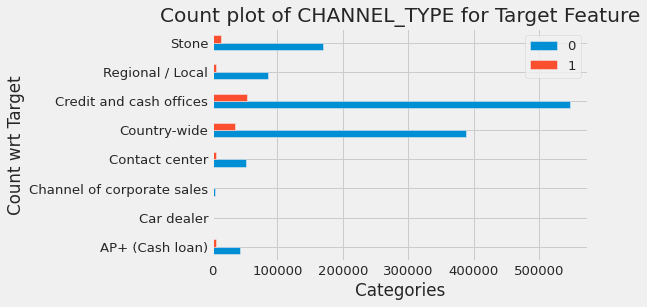

In [91]:
# PLot count with respect to Target
plot_categorical_wrt_target(prev_app, 'CHANNEL_TYPE', plot_count = True)

**Observations:**

1. Most of the people acquired by Home credit were through Credit and Cash offices (43% of all available data) followed by country wide channels of the company giving them 30% of the clients provided to us in the data.

2. These 2 categories dominate in the defaulters also as most of the defaulters got in contact with Homme credit through this channels. 

##### <b>Continuous Features EDA</b>


###### <b> AMT_DOWN_PAYMENT </b>

count    6.641610e+05
mean     6.655317e+03
std      2.062030e+04
min     -9.000000e-01
25%      0.000000e+00
50%      1.791000e+03
75%      7.695000e+03
max      3.060045e+06
Name: AMT_DOWN_PAYMENT, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


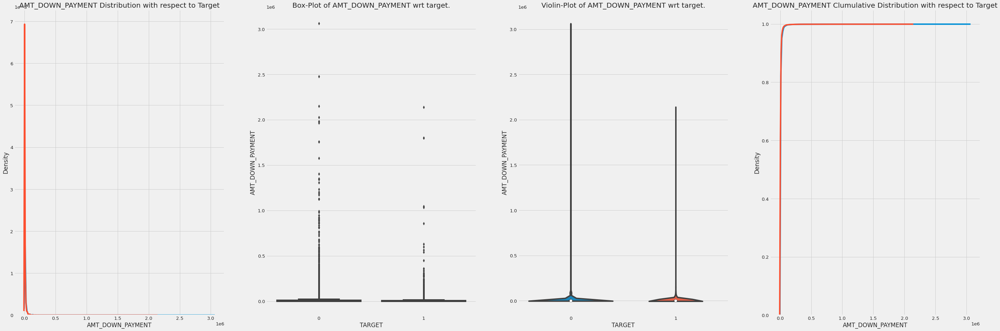

In [92]:
# PLotting this continuous feature using our helper function
plot_cont_feature(prev_app, 'AMT_DOWN_PAYMENT', with_target = True, which_plots = ['dist', 'box', 'violin', 'cdf'], describe_data =True)

count    538349.000000
mean       2042.609858
std        2920.310521
min          -0.900000
25%           0.000000
50%           0.000000
75%        4050.000000
max        9999.000000
Name: AMT_DOWN_PAYMENT, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


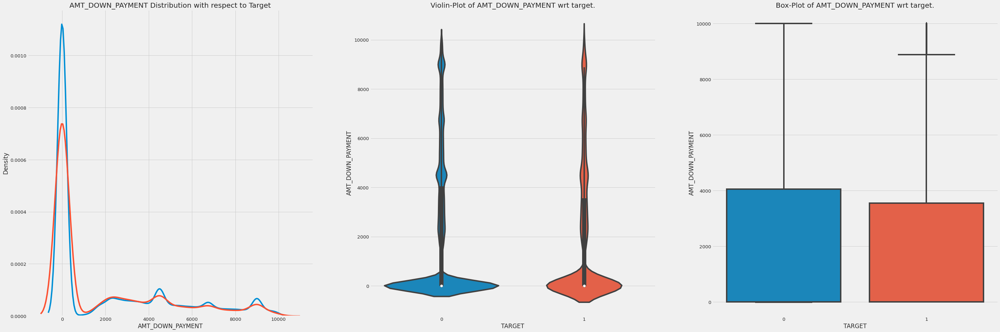

In [93]:
# Limiting the values of the feature to get better visualization.
# Limit : 1e+4
df = prev_app.loc[prev_app['AMT_DOWN_PAYMENT'] < (1*10**4)]
plot_cont_feature(df, 'AMT_DOWN_PAYMENT', with_target = True, which_plots = ['dist', 'violin', 'box'], describe_data = True)

**Observations:**

1. The mean value of down payment amount is around 6700 for the primary visalization, with maximum valuegoing upto 6 figures.

2. The graphs of the first part are very difficult to visualize. The reason for this might be that most of the values are concentrated in the lower region with only a few values having a high value of down payment. 

3. To get a better idea about this, we limit our value to 10,000. Now, the graph we see is much better and easy to interpret.

4. Both the 25% quantile and median value of the data is 0 which means there are a lot of values which are 0 in the data. This is how median is more useful to use than mean. 

5. It clearly shows that most values are in the lower range that is less than 2000, as seen in the Dist and Violin plot.

6. Box plot shows us that defaulters tend to have less values of downpayments compared to non-defaulters. 

**Conclusions:**

There are a lot of 0 values in this column as the median value is 0, which means they likely missed a downpayment our it wasnt due that month. Let's explore this a little more.

In [94]:
df_tar_0 = df[df['TARGET'] == 0]
total_count_0 = df_tar_0['TARGET'].count()
count_tar_0 = df_tar_0.loc[(prev_app['AMT_DOWN_PAYMENT'] == 0)]['AMT_DOWN_PAYMENT'].count()
df_tar_1 = df[df['TARGET'] == 1]
total_count_1 = df_tar_1['TARGET'].count()
count_tar_1 = df_tar_1.loc[(prev_app['AMT_DOWN_PAYMENT'] == 0)]['AMT_DOWN_PAYMENT'].count()

print('% of 0 values for non-defaulters : {}'.format(round((count_tar_0/total_count_0) * 100, 2)))
print('% of 0 values for defaulters : {}'.format(round((count_tar_1/total_count_1) * 100, 2)))

% of 0 values for non-defaulters : 58.21
% of 0 values for defaulters : 59.63


Hence, we can see there are more 0 values for defaulters, even though the difference is only 1.5% which is not much . Hence, this wouldn't help us much. 

###### <b> AMT_ANNUITY </b>

count    1.106483e+06
mean     1.583718e+04
std      1.472491e+04
min      0.000000e+00
25%      6.257858e+03
50%      1.122376e+04
75%      2.042078e+04
max      4.180581e+05
Name: AMT_ANNUITY, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


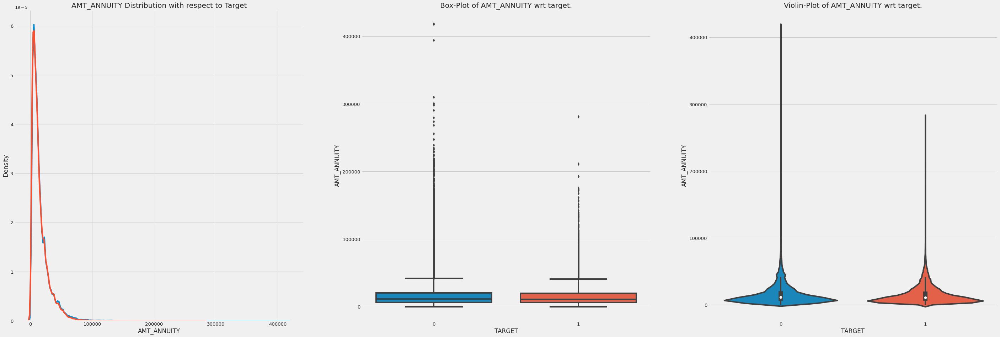

In [95]:
# PLotting this continuous feature using our helper function
plot_cont_feature(prev_app, 'AMT_ANNUITY', with_target = True, which_plots = ['dist', 'box', 'violin'], describe_data =True)

count    1.106396e+06
mean     1.582004e+04
std      1.459180e+04
min      0.000000e+00
25%      6.257318e+03
50%      1.122228e+04
75%      2.041663e+04
max      1.988592e+05
Name: AMT_ANNUITY, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


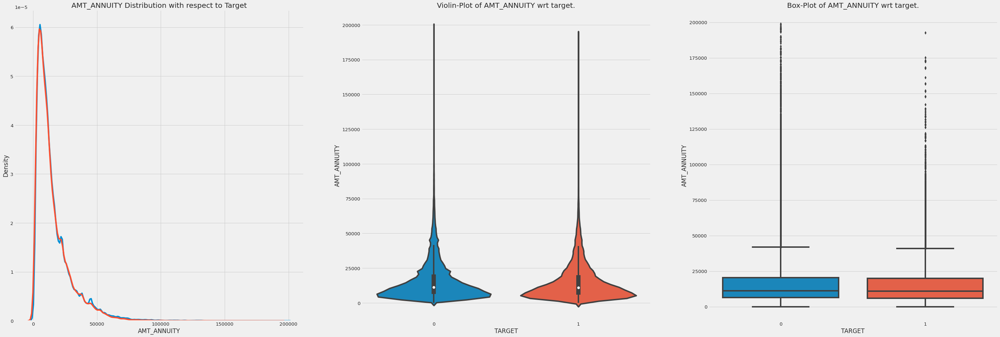

In [96]:
# Limiting the values of the feature to get better visualization.
# Limit : 1e+4
df = prev_app.loc[prev_app['AMT_ANNUITY'] < (2*10**5)]
plot_cont_feature(df, 'AMT_ANNUITY', with_target = True, which_plots = ['dist', 'violin', 'box'], describe_data = True)

**Observations:**

1. First thing to note is that we cannot differentiate between the defaulter and non-defaulter dist plot at all. 

2. Most of the values are limited to values below 100,000. So, we limited the value of the feature to get a better visualization. 

3. From the first graph, we can also see that the max value of annuity amount is only 300,000 approx for defaulters. All the values above that are for non defaulters. Hence, this can be a possible feature. (Greater_than_300,000 - Yes or No).

**Conclusions:**

This can turn out to be a useful feature for us so we will definitely use it in some way for our model. 

###### <b> AMT_GOODS_PRICE </b>

Goods price of good that client asked for (if applicable) on the previous application

count    1.094176e+06
mean     2.264512e+05
std      3.159376e+05
min      0.000000e+00
25%      4.982850e+04
50%      1.102455e+05
75%      2.295000e+05
max      5.850000e+06
Name: AMT_GOODS_PRICE, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


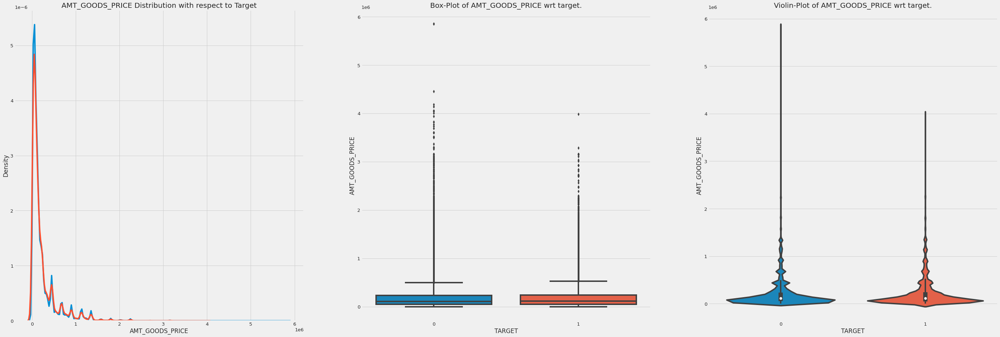

In [97]:
# PLotting this continuous feature using our helper function
plot_cont_feature(prev_app, 'AMT_GOODS_PRICE', with_target = True, which_plots = ['dist', 'box', 'violin'], describe_data =True)

count    1.084156e+06
mean     2.104281e+05
std      2.669292e+05
min      0.000000e+00
25%      4.949100e+04
50%      1.080000e+05
75%      2.268000e+05
max      1.499850e+06
Name: AMT_GOODS_PRICE, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


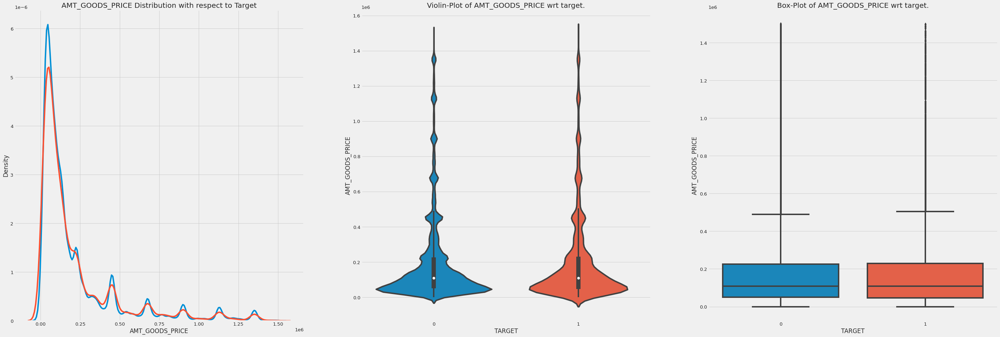

In [98]:
# Limiting the values of the feature to get better visualization.
# Limit : 1.5e+6
df = prev_app.loc[prev_app['AMT_GOODS_PRICE'] < (1.5*10**6)]
plot_cont_feature(df, 'AMT_GOODS_PRICE', with_target = True, which_plots = ['dist', 'violin', 'box'], describe_data = True)

**Observations:**

1. This feature gives the the amount of the good or object which the client asked for in his/her application.

2. The mean value of this is 200,000 and the median is 110,000. Visualization of these features is as always not that clear. 

3. The sliced value give us a much better idea about the range of values. Most of the values are below 200,000 which is the mean value. Hence, filling null values would be easier by mean imputation. 

4. There is not much difference in the plots of defaulters and non-defaulters.

**Conclusions:**

Due to the high similarity, it would not be good to use this feature as it is for model training. We will explore in the feature engineering section if somehow we can make it useful. 

### Installment_Payments

Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample. There is:

a) one row for every payment that was made.

b) one row each for missed payment.

##### <b> Load the Data </b>

In [87]:
# Loading the required data
temp = load_csv_data(directory = '../data/', file_list = ['installments_payments.csv'])
ins_pay = temp[0]

Loading your 1 csv file(s), please wait...
All the csv files loaded into memory!
Time taken to load these data file(s) : 16.02 seconds


Looking at the time taken to load this data, it must have a large number of rows. Let us know a little more about the data we just loaded.

##### <b> Basic Information about the Data </b>

In [88]:
# We will use our Data glimpse function to get some more insights about the data.
data_glimpse(ins_pay, 'installment_payments', col_dtypes = True)

The Shape of installment_payments is : (13605401, 8)
----------------------------------------------------------------------------------------------------
Columns in installment_payments :


Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Types of columns present in the dataframe: 



float64    5
int64      3
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


In [101]:
# Printing our the number of unique IDs
print('There are {} unique SK_ID_CURR values.'.format(ins_pay['SK_ID_CURR'].nunique()))
print('There are {} unique SK_ID_PREV values.'.format(ins_pay['SK_ID_PREV'].nunique()))

There are 339587 unique SK_ID_CURR values.
There are 997752 unique SK_ID_PREV values.


**Observations:**

1. There are over 10 million rows in this data and these contain the info about how and when the previous credits were paid by the applicants. 

2. There are some Current IDs which are not present in our train data. This can be said by seeing the number of unique IDs in both the data frames.

3. There are no categorical features in this dataset. Only 6 numerical features.

4. What these features depict:

* NUM_INSTALLMENT_VERSION : Version of installment calendar (0 is for credit card) of previous credit. Change of installment version from month to month signifies that some parameter of payment calendar has changed

* NUM_INSTALLMENT_NUM : On which installment we observe payment

* DAYS_INSTALLMENT : When the installment of previous credit was supposed to be paid (relative to application date of current loan)

* DAYS_ENTRY_PAYMENT : When was the installments of previous credit paid actually (relative to application date of current loan)

* AMT_INSTALMENT : What was the prescribed installment amount of previous credit on this installment

* AMT_PAYMENT : What the client actually paid on previous credit on this installment


##### <b> Missing Values </b>


In [102]:
# Using our function to get the number of missing values in the data, if any
ins_pay_missing = missing_values_table_plot(ins_pay, plot_bar = False, figsize = (15,12))
ins_pay_missing

Your selected dataframe has 8 columns.
There are 2 columns that have missing values.


,Missing Values,% of Total Values
DAYS_ENTRY_PAYMENT,2905,0.0
AMT_PAYMENT,2905,0.0


As seen, there are negligible number of missing values in the dataset. Only, 2905 values from 2 features are missing. 

Looking at the size of our data, we can easily handle this values by imputation or removal. 

##### <b>Count with respect to Target</b>

In [90]:
# Merging the target feature to our data
print("Merging TARGET column to this table")
ins_pay = app_train[['TARGET', 'SK_ID_CURR']].merge(ins_pay, on = 'SK_ID_CURR', how = 'left')
print('Done!')
print("-"*100)
print(ins_pay.columns)

Merging TARGET column to this table
Done!
----------------------------------------------------------------------------------------------------
Index(['TARGET', 'SK_ID_CURR', 'SK_ID_PREV', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')


In [104]:
# Printing counts based on Target column
print("How many datapoints we have for each Target value :")
a = ins_pay['TARGET'].value_counts().to_dict()
print('')
print("{} % of values are of target 0 ({})".format(round((a[0]*100/(a[0]+a[1])),2), a[0]))
print("{} % of values are of target 1 ({})".format(round((a[1]*100/(a[0]+a[1])), 2), a[1]))

How many datapoints we have for each Target value :

92.41 % of values are of target 0 (10726258)
7.59 % of values are of target 1 (881202)


In [91]:
# Pie Plot for the target column counts
plot_categorical_feature_count(ins_pay, feature_name = 'TARGET', plot_pie = True, plot_bar = False)

<Figure size 864x720 with 0 Axes>

**Observations:**

1. The percentage values for each of the targets is very similar to that seen in the original app_train data. 92.5% data (10.7 million) is of non-defaulters (target : 0) and 7.5% data (881k) is of defaulters (target : 1).

2. This implies a highly imbalanced data. So, we will have to develop a process to handle this condition. If we handle this for the main train data, the problem will automatically be solved for this data also. 





##### <b>Continuous Variables EDA</b>

###### <b> Correlation Matrix </b>

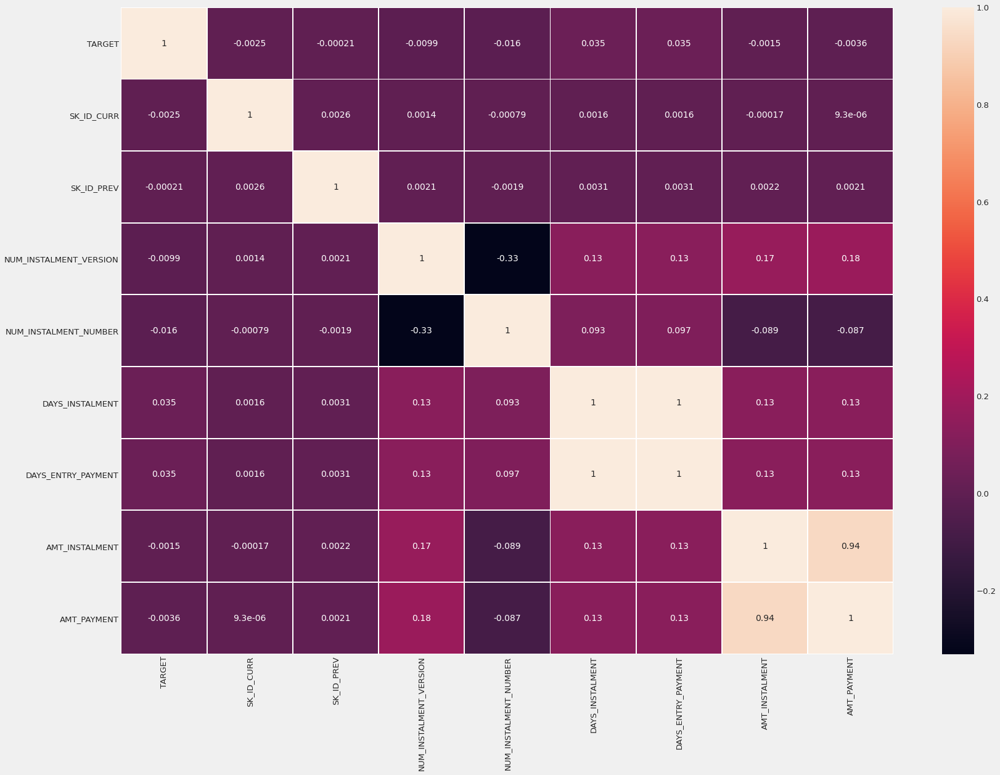

In [106]:
# Plotting the Correlation Matrix
corelations_ins_pay = compute_correlation(ins_pay, draw_matrix = True, annot = True, linewidths = 0.8, figsize = (25,18))

**Observations:**

1. Seeing the Correlation matrix, we can see that there are no highly correlated features except the AMT_PAYMENT and AMT_INSTALLMENT.  

2. But, there aren't any features which are highly correlated to the _TARGET_ feature which is undesirable. 

3. There are some features with intermediate correlation values. We will now focus on such features. 

In [92]:
#Merging by SK_ID PREV
ins_pay_wrt_id = ins_pay.groupby('SK_ID_PREV').mean()

###### <b> AMT_PAYMENT </b>

count    8.532780e+05
mean     2.600253e+04
std      6.490402e+04
min      4.500000e-02
25%      6.086342e+03
50%      1.110333e+04
75%      2.222405e+04
max      3.202062e+06
Name: AMT_PAYMENT, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


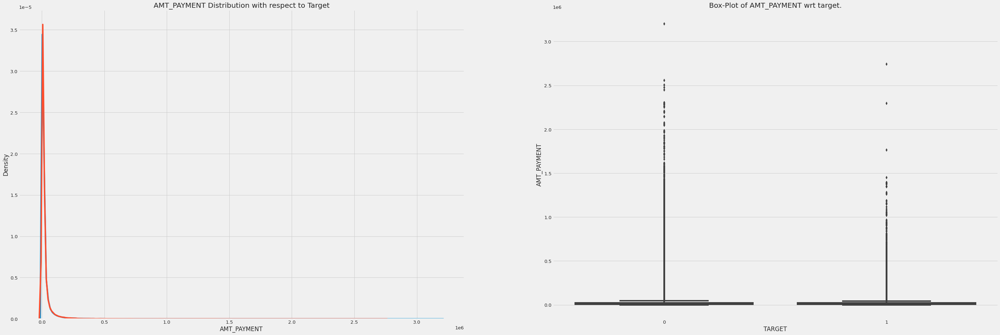

In [108]:
# Ploting different graphs for the selected feature
plot_cont_feature(ins_pay_wrt_id, 'AMT_PAYMENT', with_target = True, which_plots = ['dist', 'box'], describe_data = True)

**Observations:**

1. Seeing the data description, it is clear that range in which the values of this feature fall is of a wide span. 

2. Also, the min to max increase is gradual, so there isn't much of an outlier problem.

3. Looking at the plots now, the dist plot tells us that the values follow the same trend for both defaulters and non defaulters. 

4. Looking at the box plot, we can see that most of the values are concetrated at he bottom of the graph but there are a number of values spread out accross the give range as you can see a solid black line in the graph. 

**Conclusion:**

It was clear that these values wont by themselves prove to be useful. What would be useful is the difference between the payment and installment value for a particular ID (just an example) as that can show us a pattern about the applicant on how often does he underpay or fails to pay installments. 

Those people who do the above mentioned things would be most likely to default. Our aim is to search for applicants with a steady financial history.

###### <b>DAYS_INSTALMENT AND DAYS_ENTRY_PAYMENT</b>

In [109]:
# Creating a temporary column for the sake of visualization. 
ins_pay_wrt_id['Diff_days'] =  ins_pay_wrt_id['DAYS_INSTALMENT'] - ins_pay_wrt_id['DAYS_ENTRY_PAYMENT']

count    853344.000000
mean      -1013.489684
std         818.921072
min       -2922.000000
25%       -1590.000000
50%        -751.000000
75%        -322.000000
max          -2.000000
Name: DAYS_INSTALMENT, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


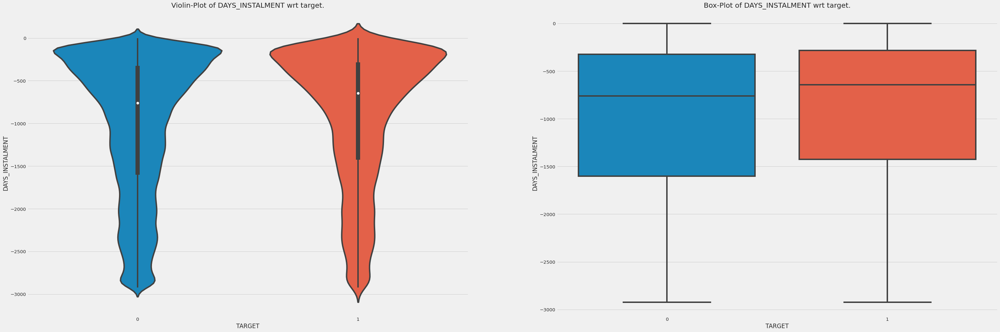

In [110]:
# Plot the DAYS_INSTALMENT Feature
plot_cont_feature(ins_pay_wrt_id, 'DAYS_INSTALMENT', with_target = True, which_plots = ['violin', 'box'], describe_data = True)

count    853278.000000
mean      -1025.044615
std         817.604817
min       -3071.000000
25%       -1602.200000
50%        -763.166667
75%        -334.333333
max          -2.000000
Name: DAYS_ENTRY_PAYMENT, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


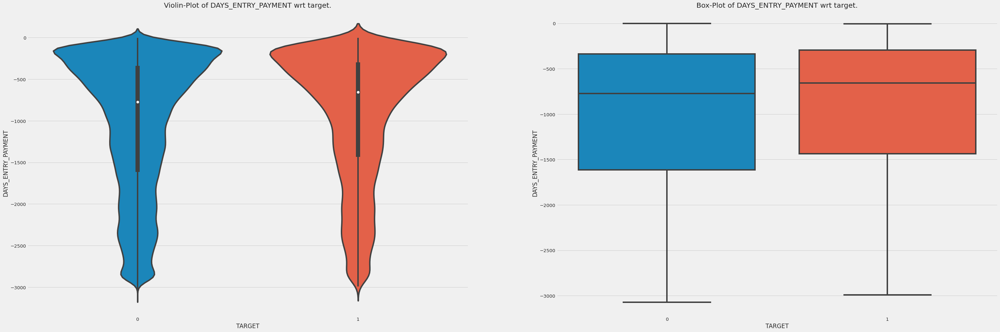

In [111]:
# Plot the Days_Entry_payment feature.
plot_cont_feature(ins_pay_wrt_id, 'DAYS_ENTRY_PAYMENT', with_target = True, which_plots = ['violin', 'box'], describe_data = True)

count    853278.000000
mean         11.503671
std          16.112872
min       -1974.047619
25%           4.916667
50%           9.400000
75%          15.909091
max        1600.000000
Name: Diff_days, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


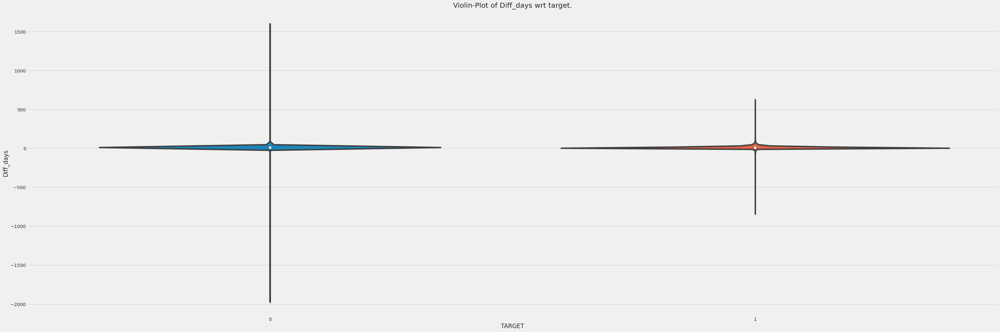

In [112]:
# PLot the feature we just created.
plot_cont_feature(ins_pay_wrt_id, 'Diff_days', with_target = True, which_plots = ['violin'], describe_data = True)

**Observations:**

As seen from the graphs, the graphs for both the selected features are quite similar. 

It is particularly seen that for deafulters, the days passed since their last payment is less as  compared to that for non-defaulters. 

So, we plotted the difference between the 2 features are we that the plot we get shows the exact same thing, with the black line short when it comes to defaulters. 

### POS_CASH_Balance

Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.

This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.

###### <b>Loading the Data</b>

In [93]:
# loading the selected data file from memory
temp = load_csv_data(directory = '../data/', file_list = ['POS_CASH_balance.csv'])
posh_cash = temp[0]

Loading your 1 csv file(s), please wait...
All the csv files loaded into memory!
Time taken to load these data file(s) : 9.18 seconds


###### <b>Basic info about the data</b>


In [94]:
# Getting the basic info using the data glimpse function
data_glimpse(posh_cash, 'posh_cash_balance', col_dtypes = True)

The Shape of posh_cash_balance is : (10001358, 8)
----------------------------------------------------------------------------------------------------
Columns in posh_cash_balance :


Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Types of columns present in the dataframe: 



int64      5
float64    2
object     1
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [95]:
# Now, we will look more about the ids it has.
print('There are {} unique SK_ID_CURR values.'.format(posh_cash['SK_ID_CURR'].nunique()))
print('There are {} unique SK_ID_PREV values.'.format(posh_cash['SK_ID_PREV'].nunique()))

print('-'*100)

# How many SK_ID_CURR values are common for both dataframes.
print('Number of overlapping SK_ID_CURR are: {}'.format(len(set(app_train.SK_ID_CURR.unique()).intersection(set(posh_cash.SK_ID_CURR.unique())))))

There are 337252 unique SK_ID_CURR values.
There are 936325 unique SK_ID_PREV values.
----------------------------------------------------------------------------------------------------
Number of overlapping SK_ID_CURR are: 289444


**Observations:**

1. There are over 10 million rows in this data. They all are the monthly statements of the cash loans of previous applications done with home credit. 

2. There is only 1 categorical feature, NAME_CONTRACT_STATUS which tells us whether the loan is currently active or not.  

3. There are 5 numrical features and the most important would be the monthly statement or balance for each loan.

4. The 1st 5 rows show that the feature SK_DPD_DEF (DPD during the month with tolerance (debts with low loan amounts are ignored) of the previous credit) which are null values. DPD stands for Days past due. The reason is that all loans with values below a given value threshold are ignored. 



###### <b> Missing Values </b>

Your selected dataframe has 8 columns.
There are 2 columns that have missing values.


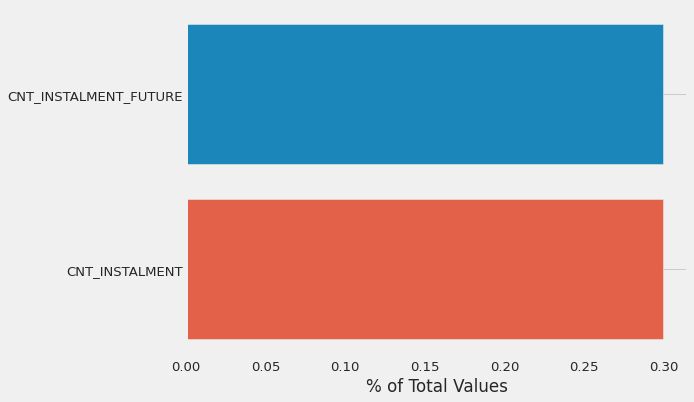

In [116]:
# Missing value table using our custom function
missing_prev_app = missing_values_table_plot(posh_cash, plot_bar = True, figsize = (8,6))

**Observations:**

1. Out of 8 columns, only 2 columns have missing values.

2. The column names are :

* CNT_INSTALMENT (Term of previous credit which may change over time) has only 0.30% of its values missing.

* CNT_INSTALMENT_FUTURE (Installments left to pay in previous credit) has only 0.30% of its values missing.

Hence, as the 2 features are so similar, my guess would be they would be both missing for the same rows in the data.


###### <b> Count based on the Target variable </b>

In [96]:
# Merging the target column
print("Merging TARGET column with POSH_CASH_Balance Data")
posh_cash = app_train[['TARGET', 'SK_ID_CURR']].merge(posh_cash, on = 'SK_ID_CURR', how = 'left')
print('Done!')
print("-"*100)
print(posh_cash.columns)

Merging TARGET column with POSH_CASH_Balance Data
Done!
----------------------------------------------------------------------------------------------------
Index(['TARGET', 'SK_ID_CURR', 'SK_ID_PREV', 'MONTHS_BALANCE',
       'CNT_INSTALMENT', 'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS',
       'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')


In [97]:
# Printing counts based on Target column
print("How many datapoints we have for each Target value :")
a = posh_cash['TARGET'].value_counts().to_dict()
print('')
print("{} % of values are of target 0 ({})".format(round((a[0]*100/(a[0]+a[1])),2), a[0]))
print("{} % of values are of target 1 ({})".format(round((a[1]*100/(a[0]+a[1])), 2), a[1]))

How many datapoints we have for each Target value :

92.64 % of values are of target 0 (7931652)
7.36 % of values are of target 1 (629790)


In [98]:
# Pie Plot for the target column counts
plot_categorical_feature_count(posh_cash, feature_name = 'TARGET', plot_pie = True, plot_bar = False)

<Figure size 864x720 with 0 Axes>

**Observations:** 

We observe the same count values as we did for all the other data files that is just around 8% of the data is for defaulters. We will take care of this by upsampling or stratified sampling during pre processing. 

###### <b> Correlation Matrix </b>


Before moving on with the EDA of all the columns, we will first see the correlation matrix. 

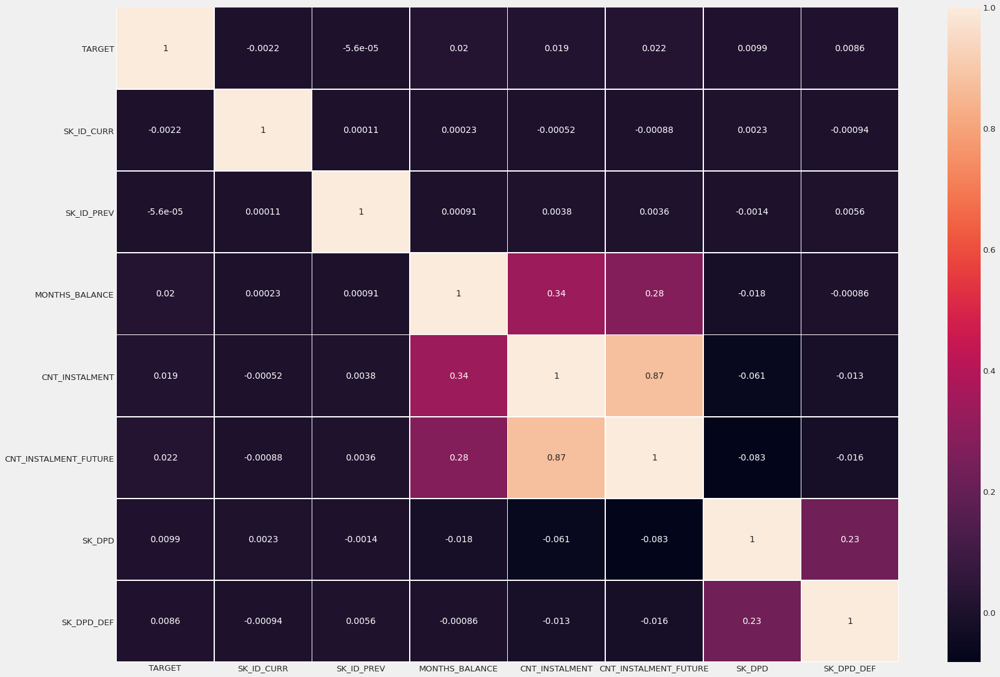

In [120]:
# Plotting the Correlation Matrix
corelations_posh_cash = compute_correlation(posh_cash, draw_matrix = True, annot = True, linewidths = 0.8, figsize = (25,18))

**Observations:**

1. Most features have very less correlation values with the target feature. 

2. CNT_INSTALMENT and CNT_INSTALMENT_FUTURE have a high correlation of 0.87. Hence, we will only visualize one of this feature for this EDA.

3. SK_DPD and SK_DPD_DEF have an medium correlation value of 0.23. 

##### <b>Categorical Features EDA</b>

###### <b> NAME_CONTRACT_TYPE </b>

In [99]:
# Count plot for the selected feature
print('Category based counts for NAME_CONTRACT_STATUS :')
print(posh_cash['NAME_CONTRACT_STATUS'].value_counts())
print('-'*100)
plot_categorical_feature_count(posh_cash, feature_name = 'NAME_CONTRACT_STATUS', plot_pie = True, plot_bar = False, figsize = (10,8))

Category based counts for NAME_CONTRACT_STATUS :
Active                   7818577
Completed                 634872
Signed                     74625
Demand                      6110
Returned to the store       4591
Approved                    4221
Amortized debt               365
Canceled                      12
XNA                            2
Name: NAME_CONTRACT_STATUS, dtype: int64
----------------------------------------------------------------------------------------------------


<Figure size 720x576 with 0 Axes>

In [100]:
# Counts Pie plot with respect to Target variable
plot_categorical_wrt_target(posh_cash, feature_name = 'NAME_CONTRACT_STATUS', plot_pie = True)

**Observations:**

1. 91.5% of the data compromises of the applications which are currently active. This is relative to the time of present application of the applicant.

2. Next category value is completed which means the loan has been completely paid off. It makes up around 7.5% of the data.

3. Rest of the categories have very less impact on the choice and there is even an unknown category XNA which needs to be taken care of. But there are only 2 such instances in the data so we do not need to worry about that much. 

**Conclusions:**

The distribution of values in percentage is quite similar for both the defaulters and non-defaulters so it would be very hard to distinguish between the two based on this data. 

We will mostly remove or disregard the less or rarely occuring categories as we have very less data for that categories.

##### <b> Continuous Features EDA </b>

###### <b> MONTHS_BALANCE </b>

count    8.543375e+06
mean    -3.494812e+01
std      2.605372e+01
min     -9.600000e+01
25%     -5.400000e+01
50%     -2.800000e+01
75%     -1.300000e+01
max     -1.000000e+00
Name: MONTHS_BALANCE, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


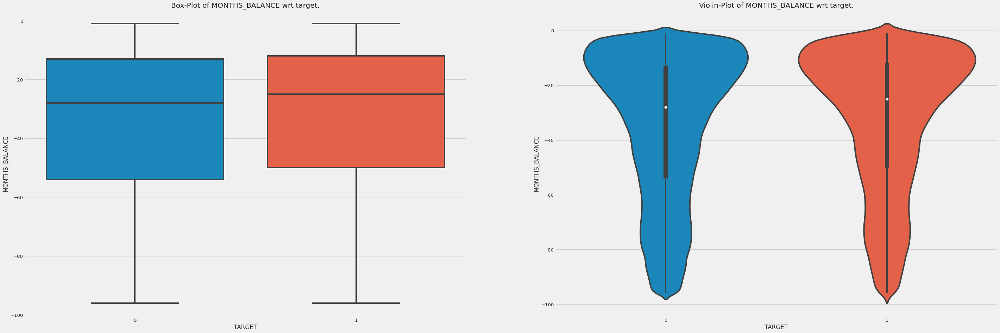

In [123]:
# PLotting this continuous feature using our helper function
plot_cont_feature(posh_cash, 'MONTHS_BALANCE', with_target = True, which_plots = ['box', 'violin'], describe_data =True)

**Observations:**

1. The values of this feature are -ve. Month of balance relative to application date (-1 means the information to the freshest monthly snapshot, 0 means the information at application - often it will be the same as -1 as many banks are not updating the information to Credit Bureau regularly).

2. The mean value of the number of months is -35 and the median value is -28.

3. Both the violin and box plots are very similar for both defaulters and non-deafulters with just a little difference. The median value of defaulters is more than that of non-defualters. This means deafulters generally have lesser months of balance relative to the application date.

**Conclusions:**

The similarity of the distributions for both target values will make it difficult for us to use this feature. 

###### <b> CNT_INSTALMENT_FEATURE </b>

count    8.521497e+06
mean     1.046808e+01
std      1.114408e+01
min      0.000000e+00
25%      3.000000e+00
50%      7.000000e+00
75%      1.400000e+01
max      8.400000e+01
Name: CNT_INSTALMENT_FUTURE, dtype: float64
------------------------------------------------------------------------------------------------------------------------------------------------------


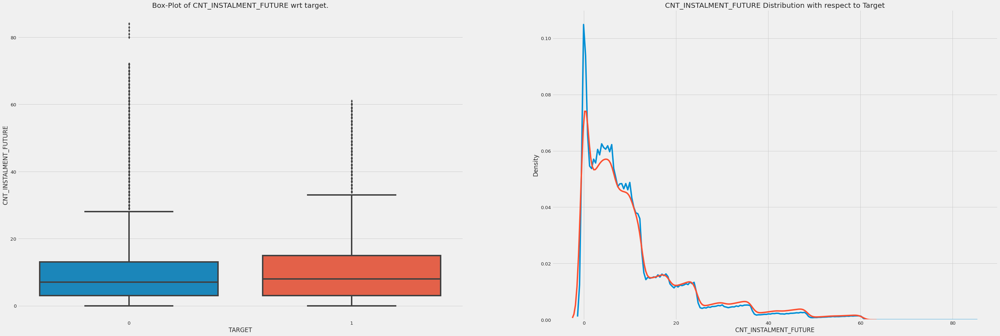

In [124]:
# PLotting this continuous feature using our helper function
plot_cont_feature(posh_cash, 'CNT_INSTALMENT_FUTURE', with_target = True, which_plots = ['box', 'dist'], describe_data =True)

**Observations:**

1. The median value for this feature is 7 and mean value is 10. 

2. The dist plot for both the target values is very very similar and follows almost the same path. 

3. If we look at the box plot, we can see one interesting thing that for defaulters, the max value of this feature is around 60 but for non-defaulters, the values goes upto 84. 

**Conclusions:**

The similarity of the distributions for both target values will make it difficult for us to use this feature. But, the 3rd point may make it possible to use this feature in some way. Also, the median value of this feature for defaulters slighly more than that for non-defaulters.

### Credit Card Balance

##### <b> Load the Data </b>

In [101]:
# Loading the required data
temp = load_csv_data(directory = '../data/', file_list = ['credit_card_balance.csv'])
credit_card = temp[0]

Loading your 1 csv file(s), please wait...
All the csv files loaded into memory!
Time taken to load these data file(s) : 13.64 seconds


Looking at the time taken to load this data, it must have a large number of rows. Let us know a little more about the data we just loaded.

##### <b> Basic Information about the Data </b>

In [126]:
# We will use our Data glimpse function to get some more insights about the data.
data_glimpse(credit_card, 'credit_card', col_dtypes = True)

The Shape of credit_card is : (3840312, 23)
----------------------------------------------------------------------------------------------------
Columns in credit_card :


Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Types of columns present in the dataframe: 



float64    15
int64       7
object      1
dtype: int64

----------------------------------------------------------------------------------------------------


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,2250.0,2250.0,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,11925.0,11925.0,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,27000.0,27000.0,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [127]:
# Printing our the number of unique IDs
print('There are {} unique SK_ID_CURR values.'.format(credit_card['SK_ID_CURR'].nunique()))
print('There are {} unique SK_ID_PREV values.'.format(credit_card['SK_ID_PREV'].nunique()))

There are 103558 unique SK_ID_CURR values.
There are 104307 unique SK_ID_PREV values.


**Observations:**

1. There are over 3.85 million rows in this data and these contain the info about the credit card balances (monthly) for 1,03,558 applicants. (only applicants who had a credit card through home credit)

2. There are some Current IDs which are not present in our train data. This can be said by seeing the number of unique IDs in both the data frames.

3. There is just 1 categorical feature in this dataset. There are 21 numerical features with information about the credit card balance related attributes of each applicant. 




##### <b> Missing Values </b>


Your selected dataframe has 23 columns.
There are 9 columns that have missing values.


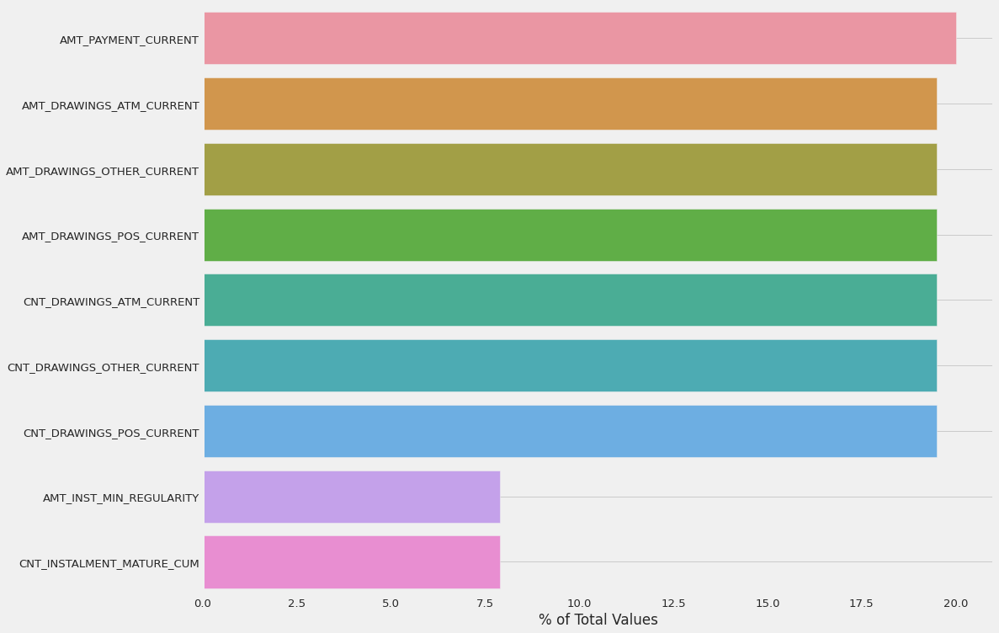

In [128]:
# Using our function to get the number of missing values in the data, if any
credit_missing = missing_values_table_plot(credit_card, plot_bar = True, figsize = (15,12))

**Observations:**

1. There are 9 columns with missing values. 

2. The AMT_PAYMENT_CURRENT has the highest number of missing values with around 20% of its values missing. 

3. The CNT_INSTALMENT_MATURE_CUM and AMT_INST_MIN_REGULARITY has the least number of missing values with just 7.5% of its values. 

4. Rest of the missing value columns have around 18% of their values missing. 


##### <b>Count with respect to Target</b>

In [102]:
# Merging the target feature to our data
print("Merging TARGET column to this table")
credit_card = app_train[['TARGET', 'SK_ID_CURR']].merge(credit_card, on = 'SK_ID_CURR', how = 'left')
print('Done!')
print("-"*100)
print(credit_card.columns)

Merging TARGET column to this table
Done!
----------------------------------------------------------------------------------------------------
Index(['TARGET', 'SK_ID_CURR', 'SK_ID_PREV', 'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT', 'AMT_INST_MIN_REGULARITY',
       'AMT_PAYMENT_CURRENT', 'AMT_PAYMENT_TOTAL_CURRENT',
       'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE',
       'CNT_DRAWINGS_ATM_CURRENT', 'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 'CNT_DRAWINGS_POS_CURRENT',
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')


In [130]:
# Printing counts based on Target column
print("How many datapoints we have for each Target value :")
a = credit_card['TARGET'].value_counts().to_dict()
print('')
print("{} % of values are of target 0 ({})".format(round((a[0]*100/(a[0]+a[1])),2), a[0]))
print("{} % of values are of target 1 ({})".format(round((a[1]*100/(a[0]+a[1])), 2), a[1]))

How many datapoints we have for each Target value :

92.83 % of values are of target 0 (3201279)
7.17 % of values are of target 1 (247292)


In [103]:
# Pie Plot for the target column counts
plot_categorical_feature_count(credit_card, feature_name = 'TARGET', plot_pie = True, plot_bar = False)

<Figure size 864x720 with 0 Axes>

###### <b> Correlation Matrix </b>

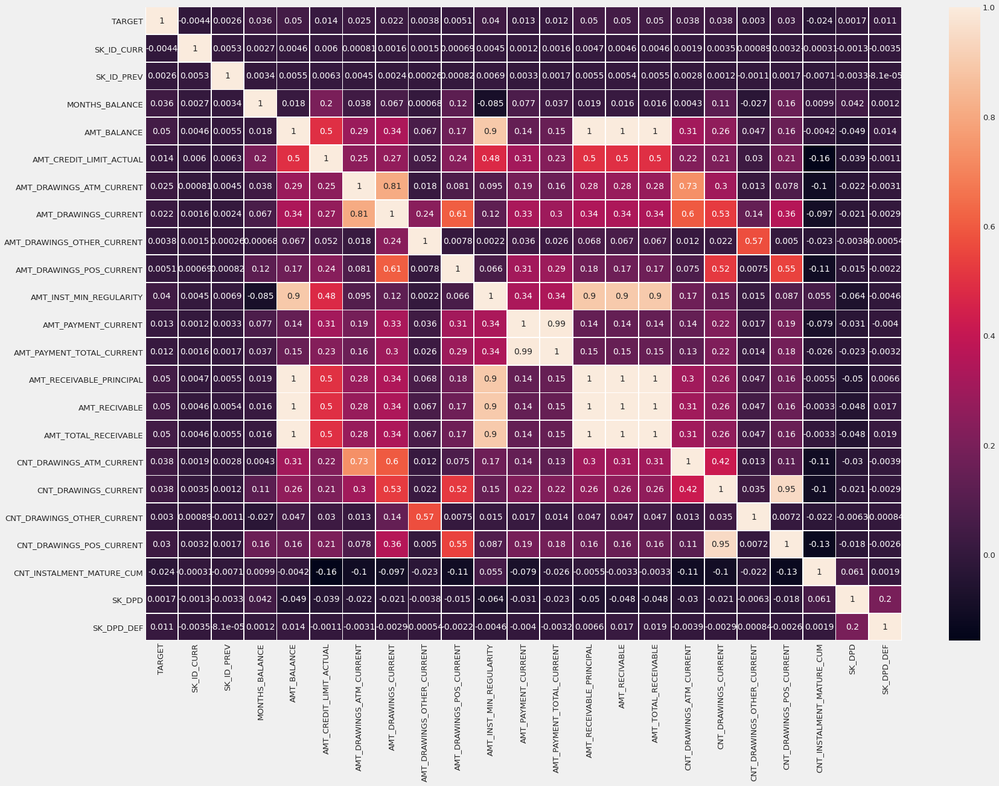

In [132]:
# Plotting the Correlation Matrix
corelations_credit_card = compute_correlation(credit_card, draw_matrix = True, annot = True, linewidths = 0.8, figsize = (25,18))

**Observations:**

1. There are a lot of correlated values in this data. Correlation values range from 0.2 (medium or low corr) to 0.9 (High Correlation).

2. But, there aren't any features which are highly correlated to the _TARGET_ feature which is undesirable. 


This completes our EDA. We will look at the overall observations for our in-depth EDA.

## Overall Observations

After performing such an indepth eda of all the data files provided to us, we have gotten a clear picture on how to move ahead. Let us see some major obsevations we made:

1. The data is highly imbalanced with just 8% of the data being defaulters. Hence, we need to do stratified up-sampling of the data so that we can make it balanced.

2. The 3 EXT_SOURCE features have a high correlation value to our target variable and they would rpove to be very important features for our classification problem.

3. Other than the 3 features stated above, all the features have nearly no correlation to the Target variable. So, Feature Engineering will be a very important step to get a good performing model, even more important than the modeling process.

4. There are a lot of missing values in most of the data files. We need to take care of them by imputation or removal. The method will depend upon the number of values missing. 


*That is all for EDA of the Home Credit Risk data files. The next notebook will cover the pre-processing and feature Engineering task.*